# Hudson Valley Gentrification and Changes in Farming

## Notebook 6: Regressions

In [ ]:
import pandas as pd
import geopandas as gpd
import os
import numpy as np
import json
import math

# Plotting/mapping
import seaborn as sns
import matplotlib.pyplot as plt
import contextily as cx
from matplotlib import colors

# Feature engineering
from tobler.util import h3fy
import h3
from tobler.area_weighted import area_interpolate
import libpysal

# Regression
import statsmodels.formula.api as smf
import statsmodels.api as sm
import spreg
from mgwr.gwr import GWR, MGWR
from mgwr.sel_bw import Sel_BW

# Spatial autocorrelation
from pysal.lib import weights
from pysal.explore import esda
from splot.esda import plot_moran
from splot.esda import plot_local_autocorrelation

c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\spaghetti\network.py:41: FutureWarning: The next major release of pysal/spaghetti (2.0.0) will drop support for all ``libpysal.cg`` geometries. This change is a first step in refactoring ``spaghetti`` that is expected to result in dramatically reduced runtimes for network instantiation and operations. Users currently requiring network and point pattern input as ``libpysal.cg`` geometries should prepare for this simply by converting to ``shapely`` geometries.
  warnings.warn(dep_msg, FutureWarning, stacklevel=1)


In [ ]:
api_key_stadia = os.getenv("STADIA_API_KEY")
api_key_census = os.getenv("CENSUS_API_KEY")
api_key_nass = os.getenv("QUICK_STATS_API_KEY")

In [ ]:
#proj_nys_east = 26918
proj_hudson = 32115
proj_nyc_ft = 2263
proj_ea = 6933
proj_latlon = 4326

## Define functions

In [ ]:
def meters_to_miles(meters):
    return meters/1609
def miles_to_meters(miles):
    return miles*1609
def sqmeters_to_sqmiles(meters):
    return meters/2.59e+6
def sqmiles_to_sqmeters(miles):
    return miles*2.59e+6
def acres_to_sqmeters(acres):
    meters = acres * 4046.8564224
    return meters
def acres_to_sqmiles(acres):
    return acres/640
def sqmiles_to_acres(sqmiles):
    return sqmiles*640
def miles_to_feet(miles):
    return miles*5280

def zfill3(x):
    zstr = str(x).zfill(3)
    return zstr

In [ ]:
def make_hex_grid(gdf, resolution, crs=6933):
    gdf = gdf.copy().to_crs(crs)
    hex_grid = h3fy(gdf, resolution=resolution)
    return hex_grid

def make_hex_grid_pts(gdf, resolution, crs=6933):
    from tobler.util import h3fy
    import geopandas as gpd
    gdf = gdf.copy()
    gdf = gdf.to_crs(crs)
    bounding_box = gdf.dissolve().envelope[0]
    bounding_box = gpd.GeoDataFrame(geometry=[bounding_box])
    bounding_box.crs = gdf.crs
    hex_grid = h3fy(bounding_box, resolution=resolution)
    return hex_grid

In [ ]:
def pair_map(gdf1, gdf2, column, crs, title, title1="2017", title2="2022"):
    vmin = min([gdf1[column].min(),gdf2[column].min()])
    vmax = max([gdf1[column].max(),gdf2[column].max()])
    missing_kwds={
            "color": "lightgrey",
            "edgecolor": "black",
            "hatch": "////",
            "label": "Missing values",
        }

    fig, axs = plt.subplots(1,2, constrained_layout=True, figsize=(10,6))
    gdf1.to_crs(crs).plot(column=column, ax=axs[0], vmin=vmin, vmax=vmax, cmap='viridis', missing_kwds=missing_kwds).set_axis_off()
    gdf2.to_crs(crs).plot(column=column, ax=axs[1], vmin=vmin, vmax=vmax, cmap='viridis', missing_kwds=missing_kwds).set_axis_off()

    axs[0].set_title(title1)
    axs[1].set_title(title2)

    for ax in axs:
        cx.add_basemap(ax=ax, crs=gdf1.to_crs(crs).crs, source=cx.providers.CartoDB.Positron)

    cbar = plt.cm.ScalarMappable(norm=plt.Normalize(vmin=vmin, vmax=vmax), cmap='viridis')

    fig.colorbar(cbar, ax=axs)
    fig.suptitle(title);

In [ ]:
def div_plot(gdf, column, crs, title, labels=False, river=False, edgecolor="grey",scheme="light"):
    vmax = max([abs(gdf[column].min()),abs(gdf[column].max())])
    vmin = vmax*-1
    vcenter = 0
    norm = colors.TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
    cmap='bwr'
    missing_kwds={
            "color": "lightgrey",
            "edgecolor": "black",
            "hatch": "////",
            "label": "Missing values",
        }

    cbar = plt.cm.ScalarMappable(norm=norm, cmap=cmap)

    fig, ax = plt.subplots(figsize=(10,6))
    gdf.to_crs(crs).plot(column=column, ax=ax, vmin=vmin, vmax=vmax, edgecolor=edgecolor, linewidth=0.5, cmap=cmap, missing_kwds=missing_kwds, norm=norm)
    if scheme == "light":
        source = cx.providers.CartoDB.Positron
        source_labels = cx.providers.CartoDB.PositronOnlyLabels
    if scheme == "dark":
        source = cx.providers.CartoDB.DarkMatter
        source_labels = cx.providers.CartoDB.DarkMatterOnlyLabels
    cx.add_basemap(ax=ax, crs=gdf.to_crs(crs).crs, source=source)
    if labels is True:
        cx.add_basemap(ax=ax, crs=gdf.to_crs(crs).crs, source=source_labels)
    if river is True:
        hudson_river.to_crs(crs).plot(ax=ax)

    fig.colorbar(cbar, ax=ax)
    plt.title(title)
    
    ax.axis('off');


## Load Data

In [ ]:
acs2017_df = pd.read_csv("data/acs2017_bg_final.csv", dtype={"GEOIDbg": str})
acs2022_df = pd.read_csv("data/acs2022_bg_final.csv", dtype={"GEOIDbg": str})
acs_diff_2022_2017 = pd.read_csv("data/acs_bg_diff_2022_2017.csv", dtype={"GEOIDbg": str})
acs_diff_2022_2017_pct = pd.read_csv("data/acs_bg_diff_2022_2017_pct.csv", dtype={"GEOIDbg": str})

ag_zipcode_2017_wide = pd.read_csv("data/agcensus_zipcode_2017_wide.csv", dtype={"zipcode": str})
ag_zipcode_2022_wide = pd.read_csv("data/agcensus_zipcode_2022_wide.csv", dtype={"zipcode": str})
ag_county_2017_wide = pd.read_csv("data/agcensus_county_2017_wide.csv", dtype={"county_code": str})
ag_county_2022_wide = pd.read_csv("data/agcensus_county_2022_wide.csv", dtype={"county_code": str})
ag_zipcode_diff_2017_2022 = pd.read_csv("data/agcensus_zipcode_diff_2017_2022.csv", dtype={"zipcode": str})
ag_county_diff_2017_2022 = pd.read_csv("data/agcensus_county_diff_2017_2022.csv", dtype={"county_code": str})

# Agriculture Census variable lookup tables
ag_zipcode_vars = pd.read_csv("data/agcensus_zipcode_vars.csv", dtype={"zipcode": str})
ag_county_vars = pd.read_csv("data/agcensus_county_vars.csv", dtype={"county_code": str})

In [ ]:
# import shapefiles
gdf_farms_clean = gpd.read_file(r"data\farms_clean.geojson").to_crs(proj_hudson)
gdf_farms_core = gpd.read_file(r"data\farms_core.geojson").to_crs(proj_hudson)

gdf_nys_counties = gpd.read_file("data/nys_counties.geojson").to_crs(proj_hudson)
gdf_zctas_core = gpd.read_file(r"data\zctas_core.geojson").to_crs(proj_hudson)
gdf_tracts2017_core = gpd.read_file("data/tracts_core_2017.geojson").to_crs(proj_hudson)
gdf_tracts2022_core = gpd.read_file("data/tracts_core_2022.geojson").to_crs(proj_hudson)
gdf_bgs2022_core = gpd.read_file("data/bgs_core_2022.geojson").to_crs(proj_hudson)
gdf_counties_core = gpd.read_file("data/counties_core.geojson").to_crs(proj_hudson)

# NYS geographic features
hudson_river = gpd.read_file("data/hudson_river.geojson").to_crs(proj_hudson)
nys_towns = gpd.read_file("data/nys_towns.geojson").to_crs(proj_hudson)
nys_villages = gpd.read_file("data/nys_villages.geojson").to_crs(proj_hudson)
nys_cities = gpd.read_file("data/nys_cities.geojson").to_crs(proj_hudson)
peja_communities = gpd.read_file("data/peja_communities.geojson").to_crs(proj_hudson)
ag_districts = gpd.read_file("data/agALLny2024.zip").to_crs(proj_hudson)

# hexagon files
hudson_2017_hex_r6 = gpd.read_file("data/hudson_2017_hex_r6.geojson")
hudson_2022_hex_r6 = gpd.read_file("data/hudson_2022_hex_r6.geojson")
hudson_diff_hex_r6 = gpd.read_file("data/hudson_diff_hex_r6.geojson")
hudson_hex_r6 = gpd.read_file("data/hudson_hex_r6.geojson")

## OLS Linear Regression

### Preparation

#### Try weighting by population

In [ ]:
df = hudson_2017_hex_r6.copy()

In [ ]:
df['pop_per_hexagon'] = df.area.apply(sqmeters_to_sqmiles) * df.pop_per_sqmi

In [ ]:
sqmeters_to_sqmiles(df.area)

0      14.455313
1      14.287192
2      14.213980
3      14.207200
4      14.327228
         ...    
381    14.336229
382    14.382951
383    14.274514
384    14.489746
385    14.434637
Length: 386, dtype: float64

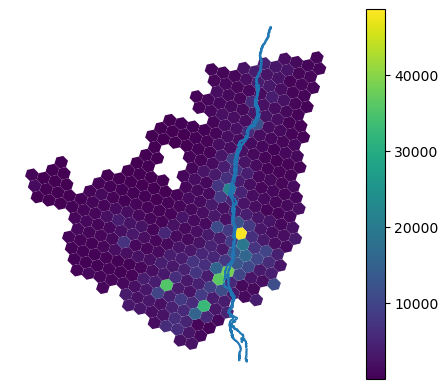

In [ ]:
ax = df.to_crs(proj_hudson).plot(column='pop_per_hexagon', legend=True)
hudson_river.to_crs(proj_hudson).plot(ax=ax)
ax.axis("off");

## Calculate all sqmi variables in hex units

In [ ]:
for df in [hudson_2017_hex_r6, hudson_2022_hex_r6, hudson_diff_hex_r6]:
    for col in df.columns:
        if col.endswith("sqmi"):
            newcol = col[:-4]+"hex"
            df[newcol] = df.to_crs(proj_ea).area.apply(sqmeters_to_sqmiles) * df[col]
#            print(newcol)
hudson_2017_hex_r6.columns

Index(['hex_id', 'geometry', 'income_median', 'moveinyear_all_trimean',
       'moveinyear_owner_trimean', 'moveinyear_renter_trimean',
       'moveinyear_pct_new_all', 'moveinyear_pct_new_owner',
       'moveinyear_pct_new_total_owner', 'moveinyear_pct_new_renter',
       'moveinyear_pct_new_total_renter', 'rent_lower_quartile', 'rent_median',
       'rent_upper_quartile', 'rent_trimean', 'rentpctincome_median',
       'seasonal_vacancy_pct', 'pop_per_sqmi', 'dwellings_per_sqmi',
       'renter_hh_per_sqmi', 'owner_hh_per_sqmi', 'seasonal_vacancy_per_sqmi',
       'farms_harvesting_per_sqmi', 'farms_selling_per_sqmi',
       'full_time_farmers_per_sqmi', 'operators_per_sqmi',
       'full_owner_operators_per_sqmi', 'part_owner_operators_per_sqmi',
       'tenant_operators_per_sqmi', 'small_farms_per_sqmi',
       'medium_farms_per_sqmi', 'large_farms_per_sqmi', 'small_farm_index',
       'medium_farm_index', 'large_farm_index', 'low_sales_farms_per_sqmi',
       'low_sales_farm_index'

In [ ]:
for df in [hudson_2017_hex_r6, hudson_2022_hex_r6]:
    df['renter_pct_per_hex'] = df['renter_hh_per_hex']/df["dwellings_per_hex"]
    df['owner_pct_per_hex'] = df['owner_hh_per_hex']/df["dwellings_per_hex"]
 
    df['full_owner_operators_pct_per_hex'] = df['full_owner_operators_per_hex'] / df['operators_per_hex']
    df['part_owner_operators_pct_per_hex'] = df['part_owner_operators_per_hex'] / df['operators_per_hex']
    df['tenant_operators_pct_per_hex'] = df['tenant_operators_per_hex'] / df['operators_per_hex']

    df['small_farms_pct_per_hex'] = df['small_farms_per_hex'] / df['farms_selling_per_hex']
    df['medium_farms_pct_per_hex'] = df['medium_farms_per_hex'] / df['farms_selling_per_hex']
    df['large_farms_pct_per_hex'] = df['large_farms_per_hex'] / df['farms_selling_per_hex']
    df['low_sales_farms_pct_per_hex'] = df['low_sales_farms_per_hex'] / df['farms_selling_per_hex']
    df['medium_sales_farms_pct_per_hex'] = df['medium_sales_farms_per_hex'] / df['farms_selling_per_hex']
    df['high_sales_farms_pct_per_hex'] = df['high_sales_farms_per_hex'] / df['farms_selling_per_hex']


In [ ]:
for col in [col for col in hudson_2022_hex_r6.columns if col.endswith('pct_per_hex')]:
    hudson_diff_hex_r6[col] = hudson_2022_hex_r6[col] - hudson_2017_hex_r6[col]

#### Code from ChatGPT to fix a math domain error in `spreg.OLS`.

In [ ]:
def perfect_corr_check(df, indep_vars):
    corr_matrix = df[indep_vars].corr().abs()
    upper_triangle = corr_matrix.where(
        np.triu(np.ones(corr_matrix.shape), k=1).astype(bool)
    )
    perfect_corrs = [column for column in upper_triangle.columns if any(upper_triangle[column] == 1.0)]
    return perfect_corrs

In [ ]:
def check_eigenvalues(df, indep_vars):
    X = df[indep_vars].values
    XtX = X.T @ X
    eigvals = np.linalg.eigvalsh(XtX)

    print("Eigenvalues of X'X:")
    print(eigvals)
    print(f"Min eigenvalue: {eigvals.min():.6e}")
    print(f"Max eigenvalue: {eigvals.max():.6e}")

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def drop_high_vif(df, indep_vars, threshold=10.0):
    while True:
        X = df[indep_vars].values
        vif = [variance_inflation_factor(X, i) for i in range(X.shape[1])]
        max_vif = max(vif)
        if max_vif > threshold:
            max_index = vif.index(max_vif)
            print(f"Dropping '{indep_vars[max_index]}' with VIF={max_vif:.2f}")
            indep_vars.pop(max_index)
        else:
            break
    return indep_vars

# indep_vars = drop_high_vif(df2017, indep_vars, 60) # above 10 implies multicollinearity, but this can be okay in a spatial model

In [ ]:
# code for scaling variables as z-scores, from ChatGPT, adapted to be a function

from sklearn.preprocessing import StandardScaler

def scale_vars(df, indep_vars):
    df = df.copy()
    scaler = StandardScaler()
    df[indep_vars] = scaler.fit_transform(df[indep_vars])
    return df

## Add in distances to NYS features

### Distance to Hudson

In [ ]:
for df in [hudson_2017_hex_r6,hudson_2022_hex_r6,hudson_diff_hex_r6]:
    df['distance_to_hudson'] = df.to_crs(proj_hudson).centroid.distance(hudson_river.to_crs(proj_hudson).geometry.iloc[0])

### Distance to nearest village and nearest city

The shapefile of towns gives their whole territory rather than the civic center, so they can't be used in this context.

In [ ]:
dfs = [hudson_2017_hex_r6,hudson_2022_hex_r6,hudson_diff_hex_r6,nys_cities,nys_villages]

for i, df in enumerate(dfs):
    dfs[i] = df.to_crs(proj_hudson)

hudson_2017_hex_r6,hudson_2022_hex_r6,hudson_diff_hex_r6,nys_cities,nys_villages = dfs

In [ ]:
dfs = [hudson_2017_hex_r6,hudson_2022_hex_r6,hudson_diff_hex_r6]
dfs_augmented = []

for i, df in enumerate(dfs):
    df2 = df.copy()
    dist_village = df.sjoin_nearest(nys_villages, how='left', distance_col="distance_to_nearest_village")[['hex_id',"distance_to_nearest_village"]].groupby("hex_id").mean()
    dist_city = df.sjoin_nearest(nys_cities, how='left', distance_col="distance_to_nearest_city")[['hex_id',"distance_to_nearest_city"]].groupby("hex_id").mean()
    
    df2['distance_to_nearest_village'] = dist_village['distance_to_nearest_village'].values
    df2['distance_to_nearest_city'] = dist_city['distance_to_nearest_city'].values
    dfs_augmented.append(df2)
    #dfs[i] = df2[]
#    print(df2.hex_id)

hudson_2017_hex_r6 = hudson_2017_hex_r6.merge(dfs_augmented[0][['hex_id','distance_to_nearest_village','distance_to_nearest_city']], how='left', on='hex_id')
hudson_2022_hex_r6 = hudson_2022_hex_r6.merge(dfs_augmented[1][['hex_id','distance_to_nearest_village','distance_to_nearest_city']], how='left', on='hex_id')
hudson_diff_hex_r6 = hudson_diff_hex_r6.merge(dfs_augmented[2][['hex_id','distance_to_nearest_village','distance_to_nearest_city']], how='left', on='hex_id')

### Areas for PEJAs and Agricultural Districts

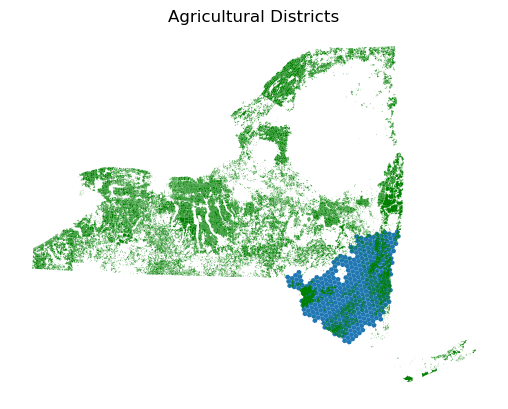

In [ ]:
ax = hudson_hex_r6.to_crs(proj_hudson).plot()
ag_districts.to_crs(proj_hudson).plot(ax=ax, facecolor="green")
plt.title("Agricultural Districts")
plt.axis("off");

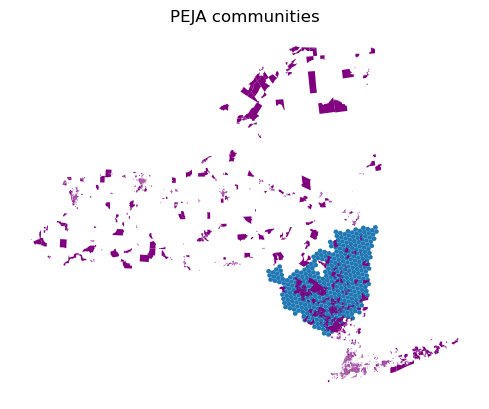

In [ ]:
ax = hudson_hex_r6.to_crs(proj_hudson).plot()
peja_communities.to_crs(proj_hudson).plot(ax=ax, facecolor="purple")
plt.title("PEJA communities")
plt.axis("off");

### Agricultural Districts

In [ ]:
hex_r6_agdistricts = gpd.overlay(ag_districts.to_crs(proj_ea), hudson_hex_r6.to_crs(proj_ea).reset_index(),how="intersection")
hex_r6_agdistricts.columns

Index(['County', 'District', 'Creation', 'Certified', 'TOWNS', 'DistCode',
       'hex_id', 'geometry'],
      dtype='object')

In [ ]:
hex_r6_agdistricts['agdistrict_area'] = hex_r6_agdistricts.area.values

In [ ]:
agdistricts_overlap = hex_r6_agdistricts.groupby("hex_id").agdistrict_area.sum().reset_index()

#### PEJAs

In [ ]:
hex_r6_pejas = gpd.overlay(peja_communities.to_crs(proj_ea), hudson_hex_r6.to_crs(proj_ea).reset_index(),how="intersection")

hex_r6_pejas['peja_area'] = hex_r6_pejas.area.values

peja_overlap = hex_r6_pejas.groupby("hex_id").peja_area.sum().reset_index()

In [ ]:
hudson_2017_hex_r6 = hudson_2017_hex_r6.merge(agdistricts_overlap, how='left', on="hex_id").merge(peja_overlap, how='left', on='hex_id').fillna({'agdistrict_area': 0, "peja_area": 0})
hudson_2022_hex_r6 = hudson_2022_hex_r6.merge(agdistricts_overlap, how='left', on="hex_id").merge(peja_overlap, how='left', on='hex_id').fillna({'agdistrict_area': 0, "peja_area": 0})
hudson_diff_hex_r6 = hudson_diff_hex_r6.merge(agdistricts_overlap, how='left', on="hex_id").merge(peja_overlap, how='left', on='hex_id').fillna({'agdistrict_area': 0, "peja_area": 0})

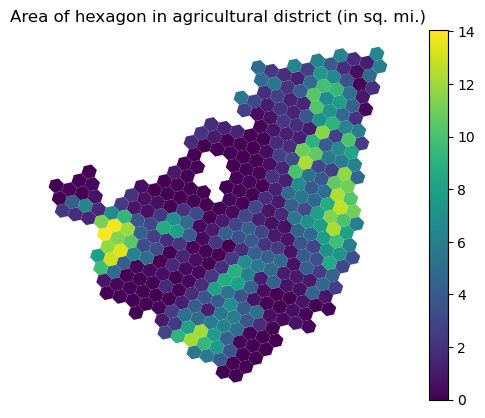

In [ ]:
hudson_2017_hex_r6.assign(agdistrict_area = lambda df: df.agdistrict_area.apply(sqmeters_to_sqmiles)).plot(column="agdistrict_area", legend=True, cmap="viridis")
plt.title("Area of hexagon in agricultural district (in sq. mi.)")
plt.axis("off");

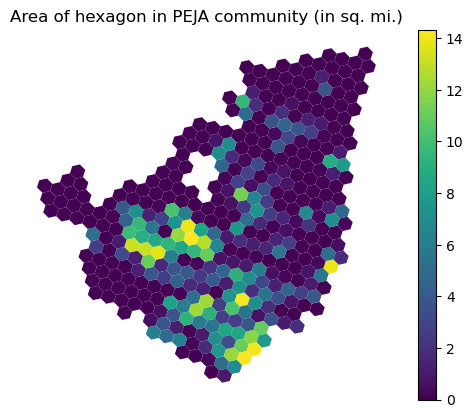

In [ ]:
hudson_2017_hex_r6.assign(peja_area = lambda df: df.peja_area.apply(sqmeters_to_sqmiles)).plot(column="peja_area", legend=True, cmap="viridis")
plt.title("Area of hexagon in PEJA community (in sq. mi.)")
plt.axis("off");

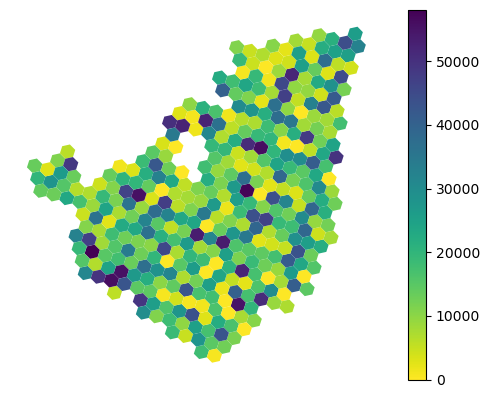

In [ ]:
hudson_2017_hex_r6.plot("distance_to_nearest_city", legend=True, cmap="viridis_r").set_axis_off();

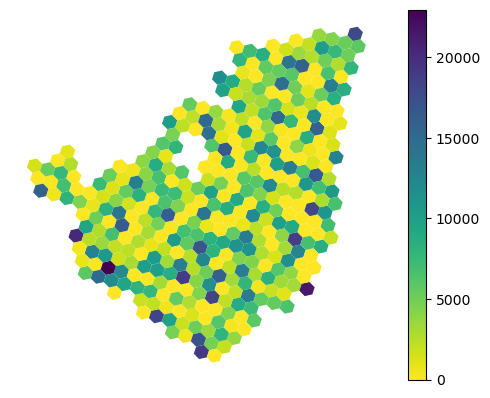

In [ ]:
hudson_2017_hex_r6.plot("distance_to_nearest_village", legend=True, cmap="viridis_r").set_axis_off();

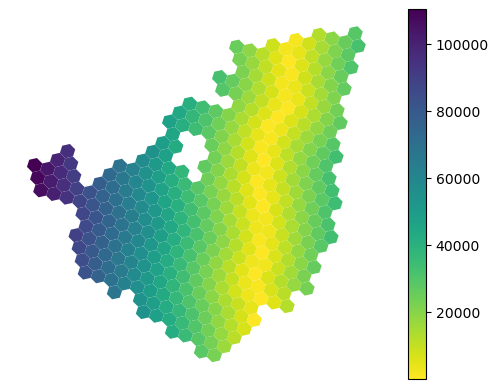

In [ ]:
hudson_2017_hex_r6.plot("distance_to_hudson", legend=True, cmap="viridis_r").set_axis_off();

### Add market farms

Test this as dependent variable for 2017 and then compare 2022 and diff.

In [ ]:
market_farm_nums = hudson_hex_r6.to_crs(proj_hudson).sjoin(gdf_farms_core.to_crs(proj_hudson), how="inner", predicate="contains")

In [ ]:
market_farm_nums = market_farm_nums.groupby("hex_id").size().reset_index(name="num_market_farms")

In [ ]:
market_farm_nums

,hex_id,num_market_farms
0,862a14437ffffff,2
1,862a144afffffff,1
2,862a144d7ffffff,1
3,862a1451fffffff,1
4,862a16027ffffff,1
5,862a1604fffffff,1
6,862a160a7ffffff,1
7,862a16147ffffff,1
8,862a1615fffffff,1
9,862a161afffffff,1


In [ ]:
hudson_2017_hex_r6 = hudson_2017_hex_r6.merge(market_farm_nums, how="left", on="hex_id")
hudson_2022_hex_r6 = hudson_2022_hex_r6.merge(market_farm_nums, how="left", on="hex_id")
hudson_diff_hex_r6 = hudson_diff_hex_r6.merge(market_farm_nums, how="left", on="hex_id")

In [ ]:
hudson_2017_hex_r6.fillna({"num_market_farms": 0}, inplace=True)
hudson_2022_hex_r6.fillna({"num_market_farms": 0}, inplace=True)
hudson_diff_hex_r6.fillna({"num_market_farms": 0}, inplace=True)

## Linear Regressions on new geographic variables

### Test just `full_time_farmers_per_hex` against market farms

In [ ]:
dep_var = 'num_market_farms'
indep_var = ['full_time_farmers_per_hex']

In [ ]:
hudson_2017_ols_prep = hudson_2017_hex_r6.dropna(subset=[dep_var]+indep_var)
w_2017 = libpysal.weights.Queen.from_dataframe(hudson_2017_ols_prep, ids="hex_id")
w_2017.transform = 'R'

In [ ]:
ols_farms_2017 = spreg.OLS(
    y = hudson_2017_ols_prep[[dep_var]].values,
    x = hudson_2017_ols_prep[indep_var].values,
    w = w_2017,
    spat_diag = True,
    moran=True,
    name_y = dep_var,
    name_x = indep_var,
    name_w = "Queen contiguity",
    name_ds = "2017 (hex R6)"
)

print(ols_farms_2017.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :2017 (hex R6)
Weights matrix      :Queen contiguity
Dependent Variable  :num_market_farms                Number of Observations:         380
Mean dependent var  :      0.1921                Number of Variables   :           2
S.D. dependent var  :      0.7209                Degrees of Freedom    :         378
R-squared           :      0.0669
Adjusted R-squared  :      0.0644
Sum squared residual:     183.799                F-statistic           :     27.1000
Sigma-square        :       0.486                Prob(F-statistic)     :   3.178e-07
S.E. of regression  :       0.697                Log likelihood        :    -401.194
Sigma-square ML     :       0.484                Akaike info criterion :     806.389
S.E of regression ML:      0.6955                Schwarz criterion     :     814.269

---------------------------------------------------

In [ ]:
hudson_2022_ols_prep = hudson_2022_hex_r6.dropna(subset=[dep_var]+indep_var)
w_2022 = libpysal.weights.Queen.from_dataframe(hudson_2022_ols_prep, ids="hex_id")
w_2022.transform = 'R'

ols_farms_2022 = spreg.OLS(
    y = hudson_2022_ols_prep[[dep_var]].values,
    x = hudson_2022_ols_prep[indep_var].values,
    w = w_2022,
    spat_diag = True,
    moran=True,
    name_y = dep_var,
    name_x = indep_var,
    name_w = "Queen contiguity",
    name_ds = "2022 (hex R6)"
)

print(ols_farms_2022.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :2022 (hex R6)
Weights matrix      :Queen contiguity
Dependent Variable  :num_market_farms                Number of Observations:         378
Mean dependent var  :      0.1931                Number of Variables   :           2
S.D. dependent var  :      0.7227                Degrees of Freedom    :         376
R-squared           :      0.0641
Adjusted R-squared  :      0.0616
Sum squared residual:     184.284                F-statistic           :     25.7461
Sigma-square        :       0.490                Prob(F-statistic)     :   6.133e-07
S.E. of regression  :       0.700                Log likelihood        :    -400.578
Sigma-square ML     :       0.488                Akaike info criterion :     805.155
S.E of regression ML:      0.6982                Schwarz criterion     :     813.025

---------------------------------------------------

In [ ]:
hudson_diff_ols_prep = hudson_diff_hex_r6.dropna(subset=[dep_var]+indep_var)
w_diff = libpysal.weights.Queen.from_dataframe(hudson_diff_ols_prep, ids="hex_id")
w_diff.transform = 'R'

ols_farms_diff = spreg.OLS(
    y = hudson_diff_ols_prep[[dep_var]].values,
    x = hudson_diff_ols_prep[indep_var].values,
    w = w_diff,
    spat_diag = True,
    moran=True,
    name_y = dep_var,
    name_x = indep_var,
    name_w = "Queen contiguity",
    name_ds = "Diff. btw. 2017 and 2022 (hex R6)"
)

print(ols_farms_diff.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :Diff. btw. 2017 and 2022 (hex R6)
Weights matrix      :Queen contiguity
Dependent Variable  :num_market_farms                Number of Observations:         376
Mean dependent var  :      0.1941                Number of Variables   :           2
S.D. dependent var  :      0.7245                Degrees of Freedom    :         374
R-squared           :      0.0001
Adjusted R-squared  :     -0.0026
Sum squared residual:      196.81                F-statistic           :      0.0328
Sigma-square        :       0.526                Prob(F-statistic)     :      0.8563
S.E. of regression  :       0.725                Log likelihood        :    -411.819
Sigma-square ML     :       0.523                Akaike info criterion :     827.638
S.E of regression ML:      0.7235                Schwarz criterion     :     835.497

-------------------------------

## Run regressions on variables that display very high multicollinearity

In [ ]:
var_list = [col for col in hudson_diff_hex_r6.columns if col.endswith('pct_per_hex') or 'trimean' in col or 'median' in col or 'quartile' in col]
drop_high_vif(hudson_diff_hex_r6.dropna(subset=var_list), var_list, 100)

Dropping 'full_owner_operators_pct_per_hex' with VIF=inf
Dropping 'low_sales_farms_pct_per_hex' with VIF=inf
Dropping 'rent_trimean' with VIF=15289.05


['income_median',
 'moveinyear_all_trimean',
 'moveinyear_owner_trimean',
 'moveinyear_renter_trimean',
 'rent_lower_quartile',
 'rent_median',
 'rent_upper_quartile',
 'rentpctincome_median',
 'renter_pct_per_hex',
 'owner_pct_per_hex',
 'part_owner_operators_pct_per_hex',
 'tenant_operators_pct_per_hex',
 'small_farms_pct_per_hex',
 'medium_farms_pct_per_hex',
 'large_farms_pct_per_hex',
 'medium_sales_farms_pct_per_hex',
 'high_sales_farms_pct_per_hex']

In [ ]:
# run regression on variables that display multicollinearity
['full_owner_operators_pct_per_hex', 'low_sales_farms_pct_per_hex', # 'moveinyear_owner_trimean',
# 'moveinyear_renter_trimean','pop_per_hex' # the last two aren't at all correlated with number of farms
]

['full_owner_operators_pct_per_hex', 'low_sales_farms_pct_per_hex']

#### Low sales farms

In [ ]:
dep_var = 'low_sales_farms_per_hex'
indep_vars = [
    # 'full_owner_operators_pct_per_hex', 
    'rent_trimean'
    ]

In [ ]:
hudson_2017_ols_prep = hudson_2017_hex_r6.copy().dropna(subset=[dep_var]+indep_vars)
w_2017 = libpysal.weights.Queen.from_dataframe(hudson_2017_ols_prep, ids="hex_id")
w_2017.transform = 'R'

ols_farms_2017 = spreg.OLS(
    y = hudson_2017_ols_prep[[dep_var]].values,
    x = hudson_2017_ols_prep[indep_vars].values,
    w = w_2017,
    spat_diag = True,
    moran=True,
    name_y = dep_var,
    name_x = indep_vars,
    name_w = "Queen contiguity",
    name_ds = "2017 (hex R6)"
)

print(ols_farms_2017.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :2017 (hex R6)
Weights matrix      :Queen contiguity
Dependent Variable  :low_sales_farms_per_hex                Number of Observations:         380
Mean dependent var  :      6.1941                Number of Variables   :           2
S.D. dependent var  :      4.0792                Degrees of Freedom    :         378
R-squared           :      0.0464
Adjusted R-squared  :      0.0439
Sum squared residual:     6013.62                F-statistic           :     18.4116
Sigma-square        :      15.909                Prob(F-statistic)     :   2.264e-05
S.E. of regression  :       3.989                Log likelihood        :   -1063.903
Sigma-square ML     :      15.825                Akaike info criterion :    2131.805
S.E of regression ML:      3.9781                Schwarz criterion     :    2139.686

--------------------------------------------

In [ ]:
GMlag_farms_2017 = spreg.GM_Lag(
    y = hudson_2017_ols_prep[[dep_var]].values,
    x = hudson_2017_ols_prep[indep_vars].values,
    w = w_2017,
    spat_diag = True,
    moran=True,
    name_y = dep_var,
    name_x = indep_vars,
    name_w = "Queen contiguity",
    name_ds = "2017 (hex R6)"
)

print(GMlag_farms_2017.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: SPATIAL TWO STAGE LEAST SQUARES
--------------------------------------------------
Data set            :2017 (hex R6)
Weights matrix      :Queen contiguity
Dependent Variable  :low_sales_farms_per_hex                Number of Observations:         380
Mean dependent var  :      6.1941                Number of Variables   :           3
S.D. dependent var  :      4.0792                Degrees of Freedom    :         377
Pseudo R-squared    :      0.7129
Spatial Pseudo R-squared: omitted due to rho outside the boundary (-1, 1).

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT        -0.65999         0.83411        -0.79125         0.42880
        rent_trimean        -0.00028         0.00080        -0.35596  

In [ ]:
MLlag_farms_2017 = spreg.ML_Lag(
    y = hudson_2017_ols_prep[[dep_var]].values,
    x = hudson_2017_ols_prep[indep_vars].values,
    w = w_2017,
    spat_diag = True,
    moran=True,
    name_y = dep_var,
    name_x = indep_vars,
    name_w = "Queen contiguity",
    name_ds = "2017 (hex R6)"
)

print(MLlag_farms_2017.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: MAXIMUM LIKELIHOOD SPATIAL LAG (METHOD = FULL)
-----------------------------------------------------------------
Data set            :2017 (hex R6)
Weights matrix      :Queen contiguity
Dependent Variable  :low_sales_farms_per_hex                Number of Observations:         380
Mean dependent var  :      6.1941                Number of Variables   :           3
S.D. dependent var  :      4.0792                Degrees of Freedom    :         377
Pseudo R-squared    :      0.7098
Spatial Pseudo R-squared:  0.0710
Log likelihood      :   -897.5869
Sigma-square ML     :      5.2764                Akaike info criterion :    1801.174
S.E of regression   :      2.2970                Schwarz criterion     :    1812.994

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
-----------------------------------------------

In [ ]:
hudson_2022_ols_prep = hudson_2022_hex_r6.copy().dropna(subset=[dep_var]+indep_vars)
w_2022 = libpysal.weights.Queen.from_dataframe(hudson_2022_ols_prep, ids="hex_id")
w_2022.transform = 'R'

ols_farms_2022 = spreg.OLS(
    y = hudson_2022_ols_prep[[dep_var]].values,
    x = hudson_2022_ols_prep[indep_vars].values,
    w = w_2022,
    spat_diag = True,
    moran=True,
    name_y = dep_var,
    name_x = indep_vars,
    name_w = "Queen contiguity",
    name_ds = "2022 (hex R6)"
)

print(ols_farms_2022.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :2022 (hex R6)
Weights matrix      :Queen contiguity
Dependent Variable  :low_sales_farms_per_hex                Number of Observations:         378
Mean dependent var  :      5.9162                Number of Variables   :           2
S.D. dependent var  :      3.9682                Degrees of Freedom    :         376
R-squared           :      0.0457
Adjusted R-squared  :      0.0432
Sum squared residual:     5665.11                F-statistic           :     18.0183
Sigma-square        :      15.067                Prob(F-statistic)     :    2.76e-05
S.E. of regression  :       3.882                Log likelihood        :   -1048.017
Sigma-square ML     :      14.987                Akaike info criterion :    2100.034
S.E of regression ML:      3.8713                Schwarz criterion     :    2107.904

--------------------------------------------

In [ ]:
GMlag_farms_2022 = spreg.GM_Lag(
    y = hudson_2022_ols_prep[[dep_var]].values,
    x = hudson_2022_ols_prep[indep_vars].values,
    w = w_2022,
    # spat_diag = True,
    # moran=True,
    name_y = dep_var,
    name_x = indep_vars,
    name_w = "Queen contiguity",
    name_ds = "2022 (hex R6)"
)

print(GMlag_farms_2022.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: SPATIAL TWO STAGE LEAST SQUARES
--------------------------------------------------
Data set            :2022 (hex R6)
Weights matrix      :Queen contiguity
Dependent Variable  :low_sales_farms_per_hex                Number of Observations:         378
Mean dependent var  :      5.9162                Number of Variables   :           3
S.D. dependent var  :      3.9682                Degrees of Freedom    :         375
Pseudo R-squared    :      0.7369
Spatial Pseudo R-squared:  0.0890

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT        -0.17235         0.73262        -0.23525         0.81401
        rent_trimean         0.00017         0.00058         0.28884         0.77270
W_low_sales_farms_per_hex 

In [ ]:
hudson_diff_ols_prep = hudson_diff_hex_r6.dropna(subset=[dep_var]+indep_vars)
w_diff = libpysal.weights.Queen.from_dataframe(hudson_diff_ols_prep, ids="hex_id")
w_diff.transform = 'R'

ols_farms_diff = spreg.OLS(
    y = hudson_diff_ols_prep[[dep_var]].values,
    x = hudson_diff_ols_prep[indep_vars].values,
    w = w_diff,
    spat_diag = True,
    moran=True,
    name_y = dep_var,
    name_x = indep_vars,
    name_w = "Queen contiguity",
    name_ds = "Diff. btw. 2017 and 2022 (hex R6)"
)

print(ols_farms_diff.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :Diff. btw. 2017 and 2022 (hex R6)
Weights matrix      :Queen contiguity
Dependent Variable  :low_sales_farms_per_hex                Number of Observations:         376
Mean dependent var  :     -0.2568                Number of Variables   :           2
S.D. dependent var  :      2.6951                Degrees of Freedom    :         374
R-squared           :      0.0032
Adjusted R-squared  :      0.0005
Sum squared residual:     2715.09                F-statistic           :      1.2018
Sigma-square        :       7.260                Prob(F-statistic)     :      0.2737
S.E. of regression  :       2.694                Log likelihood        :    -905.195
Sigma-square ML     :       7.221                Akaike info criterion :    1814.390
S.E of regression ML:      2.6872                Schwarz criterion     :    1822.249

------------------------

### Spatial models on 2017-2022 difference

#### High-sales farms

In [ ]:
dep_var = 'high_sales_farms_per_hex'

In [ ]:
indep_vars_full = [
                    'full_owner_operators_pct_per_hex',
                    'part_owner_operators_pct_per_hex',
#                    'tenant_operators_pct_per_hex',
                    'moveinyear_owner_trimean',
                    # 'moveinyear_renter_trimean',
                    ##
                    # 'income_median',
                    ##
                    # 'distance_to_nearest_city',
                    # 'distance_to_nearest_village',
                    # 'agdistrict_area',
                    'peja_area',
                    ##
                    'low_sales_farms_pct_per_hex',
                    'medium_sales_farms_pct_per_hex',
                    'farms_selling_per_hex',
                    ##
                    # 'large_farms_pct_per_hex',
                    'medium_farms_pct_per_hex',
                    # 'small_farms_pct_per_hex'
                    ]

In [ ]:
hudson_diff_prep = hudson_diff_hex_r6.copy().dropna(subset=[dep_var]+indep_vars_full)
w_diff = libpysal.weights.Queen.from_dataframe(hudson_diff_prep, ids="hex_id")
w_diff.transform = 'R'

OLS_diff_high_sales = spreg.OLS(
    y = hudson_diff_prep[[dep_var]].values,
    x = hudson_diff_prep[indep_vars_full].values,
    w = w_diff,
    spat_diag = True,
    moran=True,
    name_y = dep_var,
    name_x = indep_vars_full,
    name_w = "Queen contiguity",
    name_ds = "Diff. btw. 2017 and 2022 (hex R6)"
)

print(OLS_diff_high_sales.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :Diff. btw. 2017 and 2022 (hex R6)
Weights matrix      :Queen contiguity
Dependent Variable  :high_sales_farms_per_hex                Number of Observations:         376
Mean dependent var  :     -0.0219                Number of Variables   :           9
S.D. dependent var  :      0.8283                Degrees of Freedom    :         367
R-squared           :      0.6127
Adjusted R-squared  :      0.6043
Sum squared residual:     99.6449                F-statistic           :     72.5759
Sigma-square        :       0.272                Prob(F-statistic)     :    6.28e-71
S.E. of regression  :       0.521                Log likelihood        :    -283.861
Sigma-square ML     :       0.265                Akaike info criterion :     585.723
S.E of regression ML:      0.5148                Schwarz criterion     :     621.089

-----------------------

#### Combo model suggested

In [ ]:
# hudson_diff_prep = hudson_diff_hex_r6.dropna(subset=[dep_var]+indep_vars_full)
# w_diff = libpysal.weights.Queen.from_dataframe(hudson_diff_prep, ids="hex_id")
# w_diff.transform = 'R'

GMcombo_diff_high_sales = spreg.GM_Combo_Het(
    y = hudson_diff_prep[[dep_var]].values,
    x = hudson_diff_prep[indep_vars_full].values,
    w = w_diff,
    # spat_diag = True,
    # moran=True,
    name_y = dep_var,
    name_x = indep_vars_full,
    name_w = "Queen contiguity",
    name_ds = "Diff. btw. 2017 and 2022 (hex R6)"
)

print(GMcombo_diff_high_sales.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: SPATIALLY WEIGHTED 2SLS- GM-COMBO MODEL (HET)
----------------------------------------------------------------
Data set            :Diff. btw. 2017 and 2022 (hex R6)
Weights matrix      :Queen contiguity
Dependent Variable  :high_sales_farms_per_hex                Number of Observations:         376
Mean dependent var  :     -0.0219                Number of Variables   :          10
S.D. dependent var  :      0.8283                Degrees of Freedom    :         366
Pseudo R-squared    :      0.6845
Spatial Pseudo R-squared:  0.6176
N. of iterations    :           1                Step1c computed       :          No

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT         0.02207         0.03315         0

In [ ]:
indep_vars = [
                    'full_owner_operators_pct_per_hex',
#                    'part_owner_operators_pct_per_hex',
                    'moveinyear_owner_trimean',
                    'peja_area',
                    'low_sales_farms_pct_per_hex',
                    'medium_sales_farms_pct_per_hex',
                    'farms_selling_per_hex',
                    'medium_farms_pct_per_hex',
                    ]

In [ ]:
hudson_diff_prep = hudson_diff_hex_r6.copy().dropna(subset=[dep_var]+indep_vars)
w_diff = libpysal.weights.Queen.from_dataframe(hudson_diff_prep, ids="hex_id")
w_diff.transform = 'R'

GMcombo_diff_high_sales = spreg.GM_Combo_Het(
    y = hudson_diff_prep[[dep_var]].values,
    x = hudson_diff_prep[indep_vars].values,
    w = w_diff,
    # spat_diag = True,
    # moran=True,
    name_y = dep_var,
    name_x = indep_vars,
    name_w = "Queen contiguity",
    name_ds = "Diff. btw. 2017 and 2022 (hex R6)"
)

print(GMcombo_diff_high_sales.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: SPATIALLY WEIGHTED 2SLS- GM-COMBO MODEL (HET)
----------------------------------------------------------------
Data set            :Diff. btw. 2017 and 2022 (hex R6)
Weights matrix      :Queen contiguity
Dependent Variable  :high_sales_farms_per_hex                Number of Observations:         376
Mean dependent var  :     -0.0219                Number of Variables   :           9
S.D. dependent var  :      0.8283                Degrees of Freedom    :         367
Pseudo R-squared    :      0.6754
Spatial Pseudo R-squared:  0.6052
N. of iterations    :           1                Step1c computed       :          No

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT         0.03645         0.02830         1

In [ ]:
hudson_diff_prep['GMcombo_error_u'] = GMcombo_diff_high_sales.u

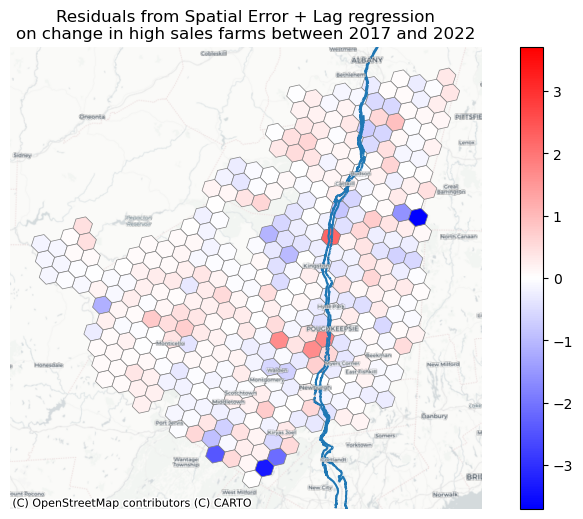

In [ ]:
div_plot(hudson_diff_prep, 'GMcombo_error_u', proj_hudson, "Residuals from Spatial Error + Lag regression\non change in high sales farms between 2017 and 2022", labels=True, river=True)

In [ ]:
hudson_diff_prep['GMcombo_error'] = GMcombo_diff_high_sales.predy[:,0] - hudson_diff_prep['large_farms_per_hex']

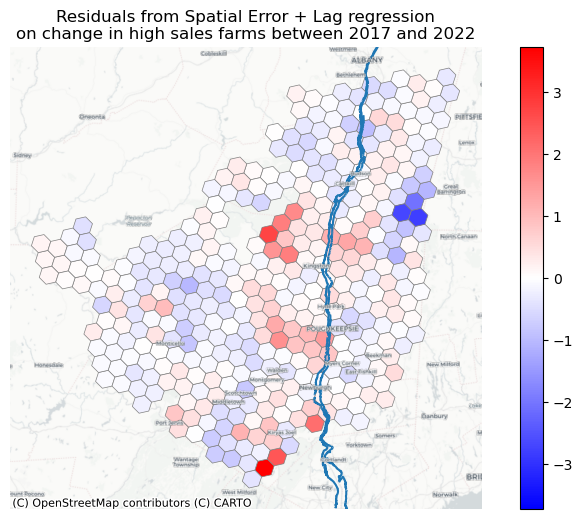

In [ ]:
div_plot(hudson_diff_prep, 'GMcombo_error', proj_hudson, "Residuals from Spatial Error + Lag regression\non change in high sales farms between 2017 and 2022", labels=True, river=True)

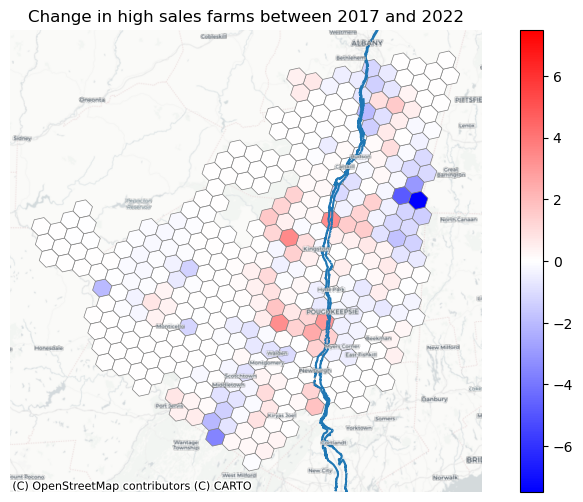

In [ ]:
div_plot(hudson_diff_prep, 'high_sales_farms_per_hex', proj_hudson, "Change in high sales farms between 2017 and 2022", labels=True, river=True)

<Axes: xlabel='high_sales_farms_per_hex', ylabel='GMcombo_error_u'>

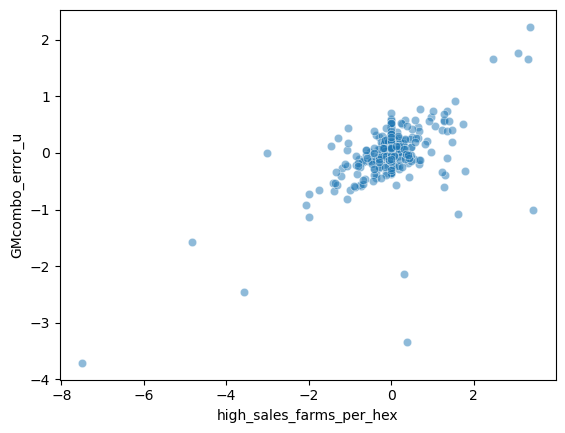

In [ ]:
sns.scatterplot(hudson_diff_prep, x='high_sales_farms_per_hex', y='GMcombo_error_u', alpha=0.5)

In [ ]:
moran = esda.moran.Moran(hudson_diff_prep['GMcombo_error_u'], w=w_diff, permutations=9999)
print(moran.I)
print(moran.p_sim)

0.14054943029434666
0.0002


In [ ]:
moran = esda.moran.Moran(hudson_diff_prep['GMcombo_error'], w=w_diff, permutations=9999)
print(moran.I)
print(moran.p_sim)

0.4329101137077789
0.0001


In [ ]:
indep_vars = [
                    'full_owner_operators_pct_per_hex',
                   'part_owner_operators_pct_per_hex',
                    'moveinyear_owner_trimean',
                    'peja_area',
                    'low_sales_farms_pct_per_hex',
                    'medium_sales_farms_pct_per_hex',
                    'farms_selling_per_hex',
                    'medium_farms_pct_per_hex',
                    ]

In [ ]:
hudson_diff_prep = hudson_diff_hex_r6.copy().dropna(subset=[dep_var]+indep_vars)
w_diff = libpysal.weights.Queen.from_dataframe(hudson_diff_prep, ids="hex_id")
w_diff.transform = 'R'

GMlag_diff_high_sales = spreg.GM_Lag(
    y = hudson_diff_prep[[dep_var]].values,
    x = hudson_diff_prep[indep_vars_full].values,
    w = w_diff,
    spat_diag = True,
    moran=True,
    name_y = dep_var,
    name_x = indep_vars_full,
    name_w = "Queen contiguity",
    name_ds = "Diff. btw. 2017 and 2022 (hex R6)"
)

print(GMlag_diff_high_sales.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: SPATIAL TWO STAGE LEAST SQUARES
--------------------------------------------------
Data set            :Diff. btw. 2017 and 2022 (hex R6)
Weights matrix      :Queen contiguity
Dependent Variable  :high_sales_farms_per_hex                Number of Observations:         376
Mean dependent var  :     -0.0219                Number of Variables   :          10
S.D. dependent var  :      0.8283                Degrees of Freedom    :         366
Pseudo R-squared    :      0.6802
Spatial Pseudo R-squared:  0.6218

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT         0.01863         0.03004         0.62027         0.53508
full_owner_operators_pct_per_hex         0.87560         0.17601         4.97487         0

In [ ]:
hudson_diff_prep['GMlag_error_u'] = GMlag_diff_high_sales.u
moran = esda.moran.Moran(hudson_diff_prep['GMlag_error_u'], w_diff, permutations = 9999)
print(moran.I)
print(moran.p_sim)

0.14944354594202625
0.0001


In [ ]:
hudson_diff_prep = hudson_diff_hex_r6.copy().dropna(subset=[dep_var]+indep_vars)
w_diff = libpysal.weights.Queen.from_dataframe(hudson_diff_prep, ids="hex_id")
w_diff.transform = 'R'

MLlag_diff_high_sales = spreg.ML_Lag(
    y = hudson_diff_prep[[dep_var]].values,
    x = hudson_diff_prep[indep_vars_full].values,
    w = w_diff,
    spat_diag = True,
    moran=True,
    name_y = dep_var,
    name_x = indep_vars_full,
    name_w = "Queen contiguity",
    name_ds = "Diff. btw. 2017 and 2022 (hex R6)"
)

print(MLlag_diff_high_sales.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: MAXIMUM LIKELIHOOD SPATIAL LAG (METHOD = FULL)
-----------------------------------------------------------------
Data set            :Diff. btw. 2017 and 2022 (hex R6)
Weights matrix      :Queen contiguity
Dependent Variable  :high_sales_farms_per_hex                Number of Observations:         376
Mean dependent var  :     -0.0219                Number of Variables   :          10
S.D. dependent var  :      0.8283                Degrees of Freedom    :         366
Pseudo R-squared    :      0.6946
Spatial Pseudo R-squared:  0.6093
Log likelihood      :   -247.7244
Sigma-square ML     :      0.2092                Akaike info criterion :     515.449
S.E of regression   :      0.4574                Schwarz criterion     :     554.745

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
--------------------------

In [ ]:
hudson_diff_prep['MLlag_error_u'] = MLlag_diff_high_sales.u
moran = esda.moran.Moran(hudson_diff_prep['MLlag_error_u'], w_diff, permutations = 9999)
print(moran.I)
print(moran.p_sim)

0.09285840310023416
0.0023


#### Medium-sales farms

In [ ]:
dep_var = "medium_sales_farms_per_hex"

In [ ]:
indep_vars_full = [
                    # 'full_owner_operators_pct_per_hex',
                    # 'part_owner_operators_pct_per_hex',
                    # 'tenant_operators_pct_per_hex',
                    'moveinyear_owner_trimean',
                    # 'moveinyear_renter_trimean',
                    ##
                    # 'income_median',
                    ##
                    # 'distance_to_nearest_city',
                    # 'distance_to_nearest_village',
                    # 'agdistrict_area',
                    # 'peja_area',
                    ##
                    'low_sales_farms_pct_per_hex',
                    'high_sales_farms_pct_per_hex',
                    'farms_selling_per_hex',
                    ##
                    # 'large_farms_pct_per_hex',
                    # 'medium_farms_pct_per_hex',
                    # 'small_farms_pct_per_hex'
                    ]


# 'moveinyear_owner_trimean',
# 'low_sales_farms_pct_per_hex',
# 'high_sales_farms_pct_per_hex',
# 'farms_selling_per_hex',

In [ ]:
hudson_diff_prep = hudson_diff_hex_r6.copy().dropna(subset=[dep_var]+indep_vars_full)
w_diff = libpysal.weights.Queen.from_dataframe(hudson_diff_prep, ids="hex_id")
w_diff.transform = 'R'

OLS_diff_medium_sales = spreg.OLS(
    y = hudson_diff_prep[[dep_var]].values,
    x = hudson_diff_prep[indep_vars_full].values,
    w = w_diff,
    spat_diag = True,
    moran=True,
    name_y = dep_var,
    name_x = indep_vars_full,
    name_w = "Queen contiguity",
    name_ds = "Diff. btw. 2017 and 2022 (hex R6)"
)

print(OLS_diff_medium_sales.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :Diff. btw. 2017 and 2022 (hex R6)
Weights matrix      :Queen contiguity
Dependent Variable  :medium_sales_farms_per_hex                Number of Observations:         376
Mean dependent var  :     -0.0952                Number of Variables   :           5
S.D. dependent var  :      1.0622                Degrees of Freedom    :         371
R-squared           :      0.5156
Adjusted R-squared  :      0.5103
Sum squared residual:     204.958                F-statistic           :     98.7083
Sigma-square        :       0.552                Prob(F-statistic)     :   3.954e-57
S.E. of regression  :       0.743                Log likelihood        :    -419.446
Sigma-square ML     :       0.545                Akaike info criterion :     848.892
S.E of regression ML:      0.7383                Schwarz criterion     :     868.540

---------------------

In [ ]:
hudson_diff_prep = hudson_diff_hex_r6.copy().dropna(subset=[dep_var]+indep_vars_full)
w_diff = libpysal.weights.Queen.from_dataframe(hudson_diff_prep, ids="hex_id")
w_diff.transform = 'R'

GMerror_diff_medium_sales = spreg.GM_Error(
    y = hudson_diff_prep[[dep_var]].values,
    x = hudson_diff_prep[indep_vars_full].values,
    w = w_diff,
    # spat_diag = True,
    # moran=True,
    name_y = dep_var,
    name_x = indep_vars_full,
    name_w = "Queen contiguity",
    name_ds = "Diff. btw. 2017 and 2022 (hex R6)"
)

print(GMerror_diff_medium_sales.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: GM SPATIALLY WEIGHTED LEAST SQUARES
------------------------------------------------------
Data set            :Diff. btw. 2017 and 2022 (hex R6)
Weights matrix      :Queen contiguity
Dependent Variable  :medium_sales_farms_per_hex                Number of Observations:         376
Mean dependent var  :     -0.0952                Number of Variables   :           5
S.D. dependent var  :      1.0622                Degrees of Freedom    :         371
Pseudo R-squared    :      0.5126

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT        -0.08455         0.07025        -1.20341         0.22882
moveinyear_owner_trimean         0.00273         0.00085         3.20164         0.00137
low_sales_farms_pct_per_h

In [ ]:
hudson_diff_prep = hudson_diff_hex_r6.copy().dropna(subset=[dep_var]+indep_vars_full)
w_diff = libpysal.weights.Queen.from_dataframe(hudson_diff_prep, ids="hex_id")
w_diff.transform = 'R'

MLerror_diff_medium_sales = spreg.ML_Error(
    y = hudson_diff_prep[[dep_var]].values,
    x = hudson_diff_prep[indep_vars_full].values,
    w = w_diff,
    # spat_diag = True,
    # moran=True,
    name_y = dep_var,
    name_x = indep_vars_full,
    name_w = "Queen contiguity",
    name_ds = "Diff. btw. 2017 and 2022 (hex R6)"
)

print(MLerror_diff_medium_sales.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ML SPATIAL ERROR (METHOD = full)
---------------------------------------------------
Data set            :Diff. btw. 2017 and 2022 (hex R6)
Weights matrix      :Queen contiguity
Dependent Variable  :medium_sales_farms_per_hex                Number of Observations:         376
Mean dependent var  :     -0.0952                Number of Variables   :           5
S.D. dependent var  :      1.0622                Degrees of Freedom    :         371
Pseudo R-squared    :      0.5126
Log likelihood      :   -394.0722
Sigma-square ML     :      0.4491                Akaike info criterion :     798.144
S.E of regression   :      0.6702                Schwarz criterion     :     817.792

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
 

c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\spreg\ml_error.py:184: RuntimeWarning: Method 'bounded' does not support relative tolerance in x; defaulting to absolute tolerance.
  res = minimize_scalar(


In [ ]:
hudson_diff_prep['GMerror_u'] = GMerror_diff_medium_sales.u
hudson_diff_prep['MLerror_u'] = MLerror_diff_medium_sales.u

moran_gm = esda.moran.Moran(hudson_diff_prep['GMerror_u'], w_diff, permutations = 9999)
print(moran_gm.I)
print(moran_gm.p_sim)
moran_ml = esda.moran.Moran(hudson_diff_prep['MLerror_u'], w_diff, permutations = 9999)
print(moran_ml.I)
print(moran_ml.p_sim)

0.25271118690696326
0.0001
0.25275750110252354
0.0001


<Axes: xlabel='medium_sales_farms_per_hex', ylabel='GMerror_u'>

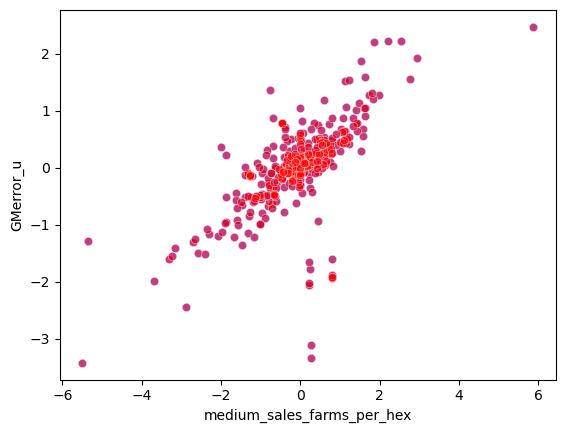

In [ ]:
ax = sns.scatterplot(hudson_diff_prep, x='medium_sales_farms_per_hex', y='GMerror_u', color='blue', alpha=.5)
sns.scatterplot(hudson_diff_prep, x='medium_sales_farms_per_hex', y='MLerror_u', color='red', alpha=.5, ax=ax)

#### Low-sales farms

In [ ]:
dep_var = 'low_sales_farms_per_hex'

In [ ]:
indep_vars_full = [
                    'full_owner_operators_pct_per_hex',
                    # 'part_owner_operators_pct_per_hex',
                    # 'tenant_operators_pct_per_hex',
                    # 'moveinyear_owner_trimean',
                    # 'moveinyear_renter_trimean',
                    #
                    # 'income_median',
                    #
                    # 'distance_to_nearest_city',
                    # 'distance_to_nearest_village',
                    # 'agdistrict_area',
                    'peja_area',
                    #
                    'medium_sales_farms_pct_per_hex',
                    'high_sales_farms_pct_per_hex',
                    'farms_selling_per_hex',
                    #
                    # 'large_farms_pct_per_hex',
                    # 'medium_farms_pct_per_hex',
                    # 'small_farms_pct_per_hex'
                    ]

In [ ]:
hudson_diff_prep = hudson_diff_hex_r6.dropna(subset=[dep_var]+indep_vars_full)
w_diff = libpysal.weights.Queen.from_dataframe(hudson_diff_prep, ids="hex_id")
w_diff.transform = 'R'

OLS_diff_low_sales = spreg.OLS(
    y = hudson_diff_prep[[dep_var]].values,
    x = hudson_diff_prep[indep_vars_full].values,
    w = w_diff,
    spat_diag = True,
    moran=True,
    name_y = dep_var,
    name_x = indep_vars_full,
    name_w = "Queen contiguity",
    name_ds = "Diff. btw. 2017 and 2022 (hex R6)"
)

print(OLS_diff_low_sales.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :Diff. btw. 2017 and 2022 (hex R6)
Weights matrix      :Queen contiguity
Dependent Variable  :low_sales_farms_per_hex                Number of Observations:         376
Mean dependent var  :     -0.2568                Number of Variables   :           6
S.D. dependent var  :      2.6951                Degrees of Freedom    :         370
R-squared           :      0.9000
Adjusted R-squared  :      0.8987
Sum squared residual:     272.269                F-statistic           :    666.3049
Sigma-square        :       0.736                Prob(F-statistic)     :  1.514e-182
S.E. of regression  :       0.858                Log likelihood        :    -472.835
Sigma-square ML     :       0.724                Akaike info criterion :     957.670
S.E of regression ML:      0.8510                Schwarz criterion     :     981.247

------------------------

In [ ]:
indep_vars_full = [
                    'full_owner_operators_pct_per_hex', #
                    # 'part_owner_operators_pct_per_hex',
                    # 'tenant_operators_pct_per_hex',
                    # 'moveinyear_owner_trimean',
                    # 'moveinyear_renter_trimean',
                    # 'seasonal_vacancy_per_hex',
                    #
                    # 'income_median',
                    #
                    # 'distance_to_nearest_city',
                    # 'distance_to_nearest_village',
                    # 'agdistrict_area',
#                    'peja_area',
                    #
                    'medium_sales_farms_pct_per_hex',   #
                    'high_sales_farms_pct_per_hex', #
                    'farms_selling_per_hex',    #
                    # 'farm_to_dwelling_ratio', #
                    #
                    # 'large_farms_pct_per_hex',
                    # 'medium_farms_pct_per_hex',
                    'small_farms_pct_per_hex'
                    ]

In [ ]:
hudson_diff_prep = hudson_diff_hex_r6.copy().dropna(subset=[dep_var]+indep_vars_full)
w_diff = libpysal.weights.Queen.from_dataframe(hudson_diff_prep, ids="hex_id")
w_diff.transform = 'R'

GMcombo_diff_low_sales = spreg.GM_Combo_Het(
    y = hudson_diff_prep[[dep_var]].values,
    x = hudson_diff_prep[indep_vars_full].values,
    w = w_diff,
    # spat_diag = True,
    # moran=True,
    name_y = dep_var,
    name_x = indep_vars_full,
    name_w = "Queen contiguity",
    name_ds = "Diff. btw. 2017 and 2022 (hex R6)"
)

print(GMcombo_diff_low_sales.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: SPATIALLY WEIGHTED 2SLS- GM-COMBO MODEL (HET)
----------------------------------------------------------------
Data set            :Diff. btw. 2017 and 2022 (hex R6)
Weights matrix      :Queen contiguity
Dependent Variable  :low_sales_farms_per_hex                Number of Observations:         376
Mean dependent var  :     -0.2568                Number of Variables   :           7
S.D. dependent var  :      2.6951                Degrees of Freedom    :         369
Pseudo R-squared    :      0.8942
Spatial Pseudo R-squared:  0.8991
N. of iterations    :           1                Step1c computed       :          No

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT         0.11672         0.12897         0.

## Test small/medium/large farms

Add 2017 and 2022 values to diff gdf.

In [ ]:
hudson_diff_hex_r6_expanded = hudson_diff_hex_r6.copy()

In [ ]:
hudson_diff_hex_r6_expanded = hudson_diff_hex_r6_expanded.merge(hudson_2017_hex_r6[[col for col in hudson_2017_hex_r6.columns if col not in['geometry', 'peja_area', 'agdistrict_area', 'num_market_farms'] and not col.startswith('distance')]],how='left', on='hex_id', suffixes=("","_2017"))

In [ ]:
hudson_diff_hex_r6_expanded = hudson_diff_hex_r6_expanded.merge(hudson_2022_hex_r6[[col for col in hudson_2022_hex_r6.columns if col not in['geometry', 'peja_area', 'agdistrict_area', 'num_market_farms'] and not col.startswith('distance')]],how='left', on='hex_id', suffixes=("","_2022"))

In [ ]:
hudson_diff_hex_r6_expanded.to_file("data/hudson_diff_hex_r6_expanded.geojson")

#### Large farms

In [ ]:
dep_var = 'large_farms_per_hex'

In [ ]:
indep_vars_full = [
                    # 'full_owner_operators_pct_per_hex', #dropped for high VIF
                #    'part_owner_operators_pct_per_hex',
                    'tenant_operators_pct_per_hex',
                    # 'moveinyear_owner_trimean',
                    # 'moveinyear_renter_trimean',
                    ##
                    # 'income_median',
                    # 'farm_to_dwelling_ratio',
                    ###
                    # 'distance_to_nearest_city',
                    # 'distance_to_nearest_village',
                    # 'distance_to_hudson',
                    # 'agdistrict_area',
                    # 'peja_area',
                    ##
                    # 'low_sales_farms_pct_per_hex', #dropped for high VIF
                    # 'medium_sales_farms_pct_per_hex',
                    'high_sales_farms_pct_per_hex',
                    # 'farms_selling_per_hex',
                    ###
                    'medium_farms_pct_per_hex',
                    'small_farms_pct_per_hex',
                    ###
                    # 'pop_per_hex_2017',
                    'large_farms_per_hex_2017',
                    'full_owner_operators_per_hex_2017',
                    # 'part_owner_operators_per_hex_2017',
                    'tenant_operators_per_hex_2017',
                    # 'income_median_2017',
                    # 'farm_to_dwelling_ratio_2017',
                    # 'moveinyear_owner_trimean_2017',
                    # 'moveinyear_renter_trimean_2017',
                    ###
                    'moveinyear_pct_new_all_2022',
                    # 'rentpctincome_median_2022',
                    # 'rent_lower_quartile_2022',
                    # 'rent_median_2022',
                    # 'rent_upper_quartile_2022',
                    ###
                    # 'rentpctincome_median',
                    # 'rent_lower_quartile',
                    # 'rent_median',
                    # 'rent_upper_quartile',
                    ]

In [ ]:
hudson_diff_prep = hudson_diff_hex_r6_expanded.copy().dropna(subset=[dep_var]+indep_vars_full)

# hudson_diff_prep['interaction_income_pop'] = hudson_diff_prep['income_median'] * hudson_diff_prep['pop_per_hex']
# indep_vars_full += ['interaction_income_pop']

w_diff = libpysal.weights.Queen.from_dataframe(hudson_diff_prep, ids="hex_id")
# w_diff = libpysal.weights.higher_order(w_diff, k=2)
w_diff.transform = 'R'

OLS_diff_large_farms = spreg.OLS(
    y = hudson_diff_prep[[dep_var]].values,
    x = hudson_diff_prep[indep_vars_full].values,
    w = w_diff,
    spat_diag = True,
    moran=True,
    name_y = dep_var,
    name_x = indep_vars_full,
    name_w = "Queen contiguity",
    name_ds = "Diff. btw. 2017 and 2022 (hex R6)"
)

print(OLS_diff_large_farms.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :Diff. btw. 2017 and 2022 (hex R6)
Weights matrix      :Queen contiguity
Dependent Variable  :large_farms_per_hex                Number of Observations:         376
Mean dependent var  :     -0.0355                Number of Variables   :           9
S.D. dependent var  :      0.2599                Degrees of Freedom    :         367
R-squared           :      0.5582
Adjusted R-squared  :      0.5485
Sum squared residual:     11.1906                F-statistic           :     57.9539
Sigma-square        :       0.030                Prob(F-statistic)     :   1.505e-60
S.E. of regression  :       0.175                Log likelihood        :     127.208
Sigma-square ML     :       0.030                Akaike info criterion :    -236.415
S.E of regression ML:      0.1725                Schwarz criterion     :    -201.049

----------------------------

In [ ]:
indep_vars = [
                    # 'full_owner_operators_pct_per_hex', #dropped for high VIF
                #    'part_owner_operators_pct_per_hex',
#                   'tenant_operators_pct_per_hex',
                    # 'moveinyear_owner_trimean',
                    # 'moveinyear_renter_trimean',
                    ##
                    # 'income_median',
                    # 'farm_to_dwelling_ratio',
                    ###
                    # 'distance_to_nearest_city',
                    # 'distance_to_nearest_village',
                    # 'distance_to_hudson',
                    # 'agdistrict_area',
                    # 'peja_area',
                    ##
                    # 'low_sales_farms_pct_per_hex', #dropped for high VIF
                    # 'medium_sales_farms_pct_per_hex',
#                    'high_sales_farms_pct_per_hex',
                    # 'farms_selling_per_hex',
                    ###
#                    'medium_farms_pct_per_hex',
#                    'small_farms_pct_per_hex',
                    ###
                    # 'pop_per_hex_2017',
                    'large_farms_per_hex_2017',
                    'full_owner_operators_per_hex_2017',
                    # 'part_owner_operators_per_hex_2017',
#                    'tenant_operators_per_hex_2017',
                    # 'income_median_2017',
                    # 'farm_to_dwelling_ratio_2017',
                    # 'moveinyear_owner_trimean_2017',
                    # 'moveinyear_renter_trimean_2017',
                    ###
#                    'moveinyear_pct_new_all_2022',
                    # 'rentpctincome_median_2022',
                    # 'rent_lower_quartile_2022',
                    # 'rent_median_2022',
                    # 'rent_upper_quartile_2022',
                    ###
                    # 'rentpctincome_median',
                    # 'rent_lower_quartile',
                    # 'rent_median',
                    # 'rent_upper_quartile',
                    ]

In [ ]:
hudson_diff_prep = hudson_diff_hex_r6_expanded.copy().dropna(subset=[dep_var]+indep_vars)

# hudson_diff_prep['interaction_income_pop'] = hudson_diff_prep['income_median'] * hudson_diff_prep['pop_per_hex']
# indep_vars_full += ['interaction_income_pop']

w_diff = libpysal.weights.Queen.from_dataframe(hudson_diff_prep, ids="hex_id")
# w_diff = libpysal.weights.higher_order(w_diff, k=2)
w_diff.transform = 'R'

GMerror_diff_large_farms = spreg.GM_Error_Het(
    y = hudson_diff_prep[[dep_var]].values,
    x = hudson_diff_prep[indep_vars].values,
    w = w_diff,
    # spat_diag = True,
    # moran=True,
    name_y = dep_var,
    name_x = indep_vars,
    name_w = "Queen contiguity",
    name_ds = "Diff. btw. 2017 and 2022 (hex R6)"
)

print(GMerror_diff_large_farms.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: GM SPATIALLY WEIGHTED LEAST SQUARES (HET)
------------------------------------------------------------
Data set            :Diff. btw. 2017 and 2022 (hex R6)
Weights matrix      :Queen contiguity
Dependent Variable  :large_farms_per_hex                Number of Observations:         376
Mean dependent var  :     -0.0355                Number of Variables   :           3
S.D. dependent var  :      0.2599                Degrees of Freedom    :         373
Pseudo R-squared    :      0.3781
N. of iterations    :           1                Step1c computed       :          No

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT        -0.01604         0.02409        -0.66570         0.50560
large_farms_per_hex_2017

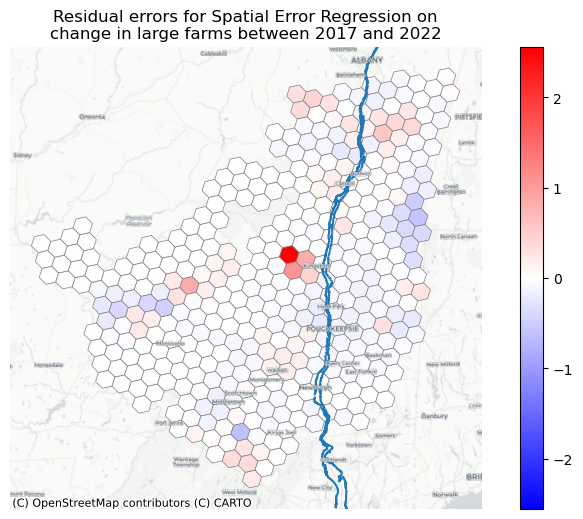

In [ ]:
hudson_diff_prep_errors = hudson_diff_prep.copy()
hudson_diff_prep_errors['GMerror_residuals'] = GMerror_diff_large_farms.predy[:,0] - hudson_diff_prep_errors['large_farms_per_hex']
hudson_diff_prep_errors['GMerror_residuals_u'] = GMerror_diff_large_farms.u

div_plot(hudson_diff_prep_errors, 'GMerror_residuals_u', proj_hudson, "Residual errors for Spatial Error Regression on\nchange in large farms between 2017 and 2022",labels=True,river=True)


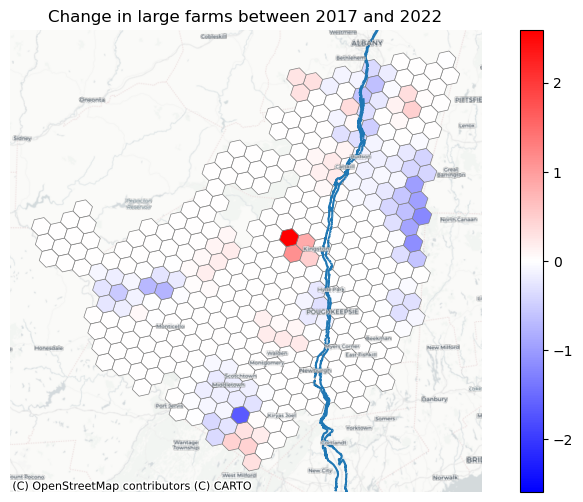

In [ ]:
div_plot(hudson_diff_prep_errors, 'large_farms_per_hex', proj_hudson, "Change in large farms between 2017 and 2022",labels=True,river=True)

*ChatGPT recommends trying a Durbin Model to deal with the clustered spatial error that still exists; I may come back to this later.*

#### Medium farms

In [ ]:
dep_var = 'medium_farms_per_hex'

In [ ]:
indep_vars_full = [
                #    'full_owner_operators_pct_per_hex',    # removed for infinite multicollinearity
                   'part_owner_operators_pct_per_hex',
                    'tenant_operators_pct_per_hex',
                    # 'moveinyear_owner_trimean',
                    # 'moveinyear_renter_trimean',
                    # 'seasonal_vacancy_per_hex',
                    ###
                    # 'income_median',
                    'farm_to_dwelling_ratio',
                    ###
                    # 'distance_to_nearest_city',
                    # 'distance_to_nearest_village',
                    # 'distance_to_hudson',
                    # 'agdistrict_area',
                    # 'peja_area',
                    ##
                    # 'low_sales_farms_pct_per_hex',    # removed for infinite multicollinearity
                    # 'medium_sales_farms_pct_per_hex',
                    # 'high_sales_farms_pct_per_hex',
                    'farms_selling_per_hex',
                    ###
                    'large_farms_pct_per_hex',
                    # 'small_farms_pct_per_hex',
                    ###
                    # 'pop_per_hex_2017',
                    # 'large_farms_per_hex_2017',
                    'medium_farms_per_hex_2017',
                    'small_farms_per_hex_2017',
                    # 'full_owner_operators_per_hex_2017',
                    'part_owner_operators_per_hex_2017',
                    # 'tenant_operators_per_hex_2017',
                    # 'income_median_2017',
                    'farm_to_dwelling_ratio_2017',
                    # 'moveinyear_owner_trimean_2017',
                    'moveinyear_renter_trimean_2017',
                    ##
                  #   'moveinyear_pct_new_all_2022',
                    # 'rentpctincome_median_2022',
                    # 'rent_lower_quartile_2022',
                    # 'rent_median_2022',
                    # 'rent_upper_quartile_2022',
                    ##
                    # 'rentpctincome_median',
                    'rent_lower_quartile',
                    # 'rent_median',
                    # 'rent_upper_quartile',
                    
                    ]

In [ ]:
hudson_diff_prep = hudson_diff_hex_r6_expanded.copy().dropna(subset=[dep_var]+indep_vars_full)

# hudson_diff_prep['interaction_income_pop'] = hudson_diff_prep['income_median'] * hudson_diff_prep['pop_per_hex']
# indep_vars_full += ['interaction_income_pop']

# hudson_diff_prep['interaction_income_city'] = hudson_diff_prep['income_median'] * hudson_diff_prep['distance_to_nearest_city']
# indep_vars_full += ['interaction_income_city']


w_diff = libpysal.weights.Queen.from_dataframe(hudson_diff_prep, ids="hex_id")
w_diff.transform = 'R'

OLS_diff_medium_farms = spreg.OLS(
    y = hudson_diff_prep[[dep_var]].values,
    x = hudson_diff_prep[indep_vars_full].values,
    w = w_diff,
    spat_diag = True,
    moran=True,
    name_y = dep_var,
    name_x = indep_vars_full,
    name_w = "Queen contiguity",
    name_ds = "Diff. btw. 2017 and 2022 (hex R6)"
)

print(OLS_diff_medium_farms.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :Diff. btw. 2017 and 2022 (hex R6)
Weights matrix      :Queen contiguity
Dependent Variable  :medium_farms_per_hex                Number of Observations:         376
Mean dependent var  :     -0.2371                Number of Variables   :          12
S.D. dependent var  :      1.2460                Degrees of Freedom    :         364
R-squared           :      0.6082
Adjusted R-squared  :      0.5963
Sum squared residual:     228.115                F-statistic           :     51.3648
Sigma-square        :       0.627                Prob(F-statistic)     :    2.86e-67
S.E. of regression  :       0.792                Log likelihood        :    -439.570
Sigma-square ML     :       0.607                Akaike info criterion :     903.141
S.E of regression ML:      0.7789                Schwarz criterion     :     950.296

---------------------------

In [ ]:
indep_vars = [
                #    'full_owner_operators_pct_per_hex',    # removed for infinite multicollinearity
                   'part_owner_operators_pct_per_hex',
                  #   'tenant_operators_pct_per_hex',
                    # 'moveinyear_owner_trimean',
                    # 'moveinyear_renter_trimean',
                    # 'seasonal_vacancy_per_hex',
                    ###
                    # 'income_median',
                    'farm_to_dwelling_ratio',
                    ###
                    # 'distance_to_nearest_city',
                    # 'distance_to_nearest_village',
                    # 'distance_to_hudson',
                    # 'agdistrict_area',
                    # 'peja_area',
                    ##
                    # 'low_sales_farms_pct_per_hex',    # removed for infinite multicollinearity
                    # 'medium_sales_farms_pct_per_hex',
                    # 'high_sales_farms_pct_per_hex',
                    'farms_selling_per_hex',
                    ###
#                    'large_farms_pct_per_hex',
                    # 'small_farms_pct_per_hex',
                    ###
                    # 'pop_per_hex_2017',
                    # 'large_farms_per_hex_2017',
                    'medium_farms_per_hex_2017',
                    'small_farms_per_hex_2017',
                    # 'full_owner_operators_per_hex_2017',
                    'part_owner_operators_per_hex_2017',
                    # 'tenant_operators_per_hex_2017',
                    # 'income_median_2017',
                    'farm_to_dwelling_ratio_2017',
                    # 'moveinyear_owner_trimean_2017',
                    'moveinyear_renter_trimean_2017',
                    ##
                  #   'moveinyear_pct_new_all_2022',
                    # 'rentpctincome_median_2022',
                    # 'rent_lower_quartile_2022',
                    # 'rent_median_2022',
                    # 'rent_upper_quartile_2022',
                    ##
                    # 'rentpctincome_median',
#                    'rent_lower_quartile',
                    # 'rent_median',
                    # 'rent_upper_quartile',
                    
                    ]

In [ ]:
hudson_diff_prep = hudson_diff_hex_r6_expanded.copy().dropna(subset=[dep_var]+indep_vars)
w_diff = libpysal.weights.Queen.from_dataframe(hudson_diff_prep, ids="hex_id")
w_diff.transform = 'R'

GMerror_diff_medium_farms = spreg.GM_Error_Het(
    y = hudson_diff_prep[[dep_var]].values,
    x = hudson_diff_prep[indep_vars].values,
    w = w_diff,
    # spat_diag = True,
    # moran=True,
    name_y = dep_var,
    name_x = indep_vars,
    name_w = "Queen contiguity",
    name_ds = "Diff. btw. 2017 and 2022 (hex R6)"
)

print(GMerror_diff_medium_farms.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: GM SPATIALLY WEIGHTED LEAST SQUARES (HET)
------------------------------------------------------------
Data set            :Diff. btw. 2017 and 2022 (hex R6)
Weights matrix      :Queen contiguity
Dependent Variable  :medium_farms_per_hex                Number of Observations:         376
Mean dependent var  :     -0.2371                Number of Variables   :           9
S.D. dependent var  :      1.2460                Degrees of Freedom    :         367
Pseudo R-squared    :      0.5775
N. of iterations    :           1                Step1c computed       :          No

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT        -5.84007         1.74992        -3.33733         0.00085
part_owner_operators_pc

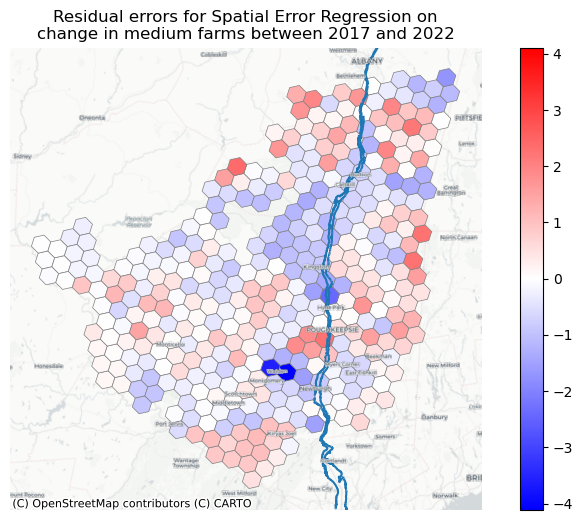

In [ ]:
hudson_diff_prep_errors = hudson_diff_prep.copy()
hudson_diff_prep_errors['GMerror_residuals'] = GMerror_diff_medium_farms.predy[:,0] - hudson_diff_prep_errors['medium_farms_per_hex']
hudson_diff_prep_errors['GMerror_residuals_u'] = GMerror_diff_medium_farms.u

div_plot(hudson_diff_prep_errors, 'GMerror_residuals_u', proj_hudson, "Residual errors for Spatial Error Regression on\nchange in medium farms between 2017 and 2022",labels=True,river=True)


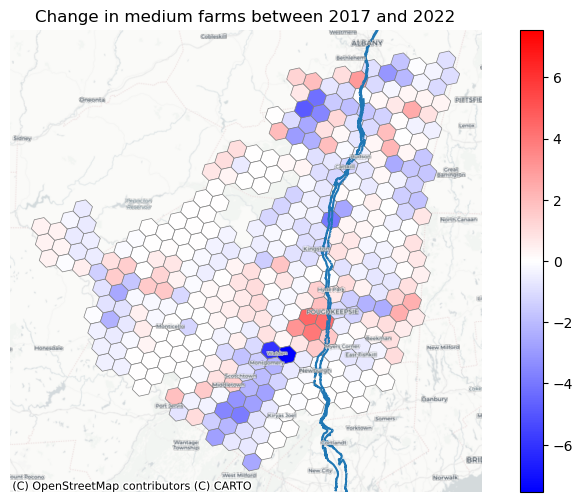

In [ ]:
div_plot(hudson_diff_prep_errors, 'medium_farms_per_hex', proj_hudson, "Change in medium farms between 2017 and 2022",labels=True,river=True)

In [ ]:
moran = esda.moran.Moran(hudson_diff_prep_errors['GMerror_residuals_u'], w_diff, permutations=9999)

In [ ]:
print(moran.I)
print(moran.p_sim)

0.4030809167923994
0.0001


#### Small farms

In [ ]:
dep_var = "small_farms_per_hex"

In [ ]:
indep_vars_full = [
                #    'full_owner_operators_pct_per_hex',    # removed for infinite multicollinearity
                  #  'part_owner_operators_pct_per_hex',
                    # 'tenant_operators_pct_per_hex',
                    # 'moveinyear_owner_trimean',
                    # 'moveinyear_renter_trimean',
                    # 'seasonal_vacancy_per_hex',
                    ###
                    # 'income_median',
                    # 'farm_to_dwelling_ratio',
                    ###
                    # 'distance_to_nearest_city',
                    # 'distance_to_nearest_village',
                    # 'distance_to_hudson',
                  #   'agdistrict_area',
                    # 'peja_area',
                    ##
                    # 'low_sales_farms_pct_per_hex',    # removed for infinite multicollinearity
                    # 'medium_sales_farms_pct_per_hex',
                    # 'high_sales_farms_pct_per_hex',
                    'farms_selling_per_hex',
                    ###
                    # 'large_farms_pct_per_hex',
                    'medium_farms_pct_per_hex',
                    ###
                    # 'pop_per_hex_2017',
                    # 'large_farms_per_hex_2017',
                    # 'medium_farms_per_hex_2017',
                    'small_farms_per_hex_2017',
                    'full_owner_operators_per_hex_2017',
                    'part_owner_operators_per_hex_2017',
                    # 'tenant_operators_per_hex_2017',
                    # 'income_median_2017',
                    # 'farm_to_dwelling_ratio_2017',
                    # 'moveinyear_owner_trimean_2017',
                    # 'moveinyear_renter_trimean_2017',
                    ###
                    'moveinyear_pct_new_all_2022',
                    # 'rentpctincome_median_2022',
                    # 'rent_lower_quartile_2022',
                    # 'rent_median_2022',
                    'rent_upper_quartile_2022',
                    ###
                    # 'rentpctincome_median',
                    # 'rent_lower_quartile',
                    # 'rent_median',
                    # 'rent_upper_quartile',
                    
                    ]

In [ ]:
hudson_diff_prep = hudson_diff_hex_r6_expanded.copy().dropna(subset=[dep_var]+indep_vars_full)

# hudson_diff_prep['interaction_income_pop'] = hudson_diff_prep['income_median'] * hudson_diff_prep['pop_per_hex']
# indep_vars_full += ['interaction_income_pop']

# hudson_diff_prep['interaction_income_city'] = hudson_diff_prep['income_median'] * hudson_diff_prep['distance_to_nearest_city']
# indep_vars_full += ['interaction_income_city']


w_diff = libpysal.weights.Queen.from_dataframe(hudson_diff_prep, ids="hex_id")
w_diff.transform = 'R'

OLS_diff_small_farms = spreg.OLS(
    y = hudson_diff_prep[[dep_var]].values,
    x = hudson_diff_prep[indep_vars_full].values,
    w = w_diff,
    spat_diag = True,
    moran=True,
    name_y = dep_var,
    name_x = indep_vars_full,
    name_w = "Queen contiguity",
    name_ds = "Diff. btw. 2017 and 2022 (hex R6)"
)

print(OLS_diff_small_farms.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :Diff. btw. 2017 and 2022 (hex R6)
Weights matrix      :Queen contiguity
Dependent Variable  :small_farms_per_hex                Number of Observations:         376
Mean dependent var  :      0.0791                Number of Variables   :           8
S.D. dependent var  :      1.9753                Degrees of Freedom    :         368
R-squared           :      0.6220
Adjusted R-squared  :      0.6148
Sum squared residual:     553.043                F-statistic           :     86.5180
Sigma-square        :       1.503                Prob(F-statistic)     :   7.775e-74
S.E. of regression  :       1.226                Log likelihood        :    -606.060
Sigma-square ML     :       1.471                Akaike info criterion :    1228.120
S.E of regression ML:      1.2128                Schwarz criterion     :    1259.556

----------------------------

In [ ]:
indep_vars = [
                #    'full_owner_operators_pct_per_hex',    # removed for infinite multicollinearity
                  #  'part_owner_operators_pct_per_hex',
                    # 'tenant_operators_pct_per_hex',
                    # 'moveinyear_owner_trimean',
                    # 'moveinyear_renter_trimean',
                    # 'seasonal_vacancy_per_hex',
                    ###
                    # 'income_median',
                    # 'farm_to_dwelling_ratio',
                    ###
                    # 'distance_to_nearest_city',
                    # 'distance_to_nearest_village',
                    # 'distance_to_hudson',
                  #   'agdistrict_area',
                    # 'peja_area',
                    ##
                    # 'low_sales_farms_pct_per_hex',    # removed for infinite multicollinearity
                    # 'medium_sales_farms_pct_per_hex',
                    # 'high_sales_farms_pct_per_hex',
                    'farms_selling_per_hex',
                    ###
                    # 'large_farms_pct_per_hex',
                    'medium_farms_pct_per_hex',
                    ###
                    # 'pop_per_hex_2017',
                    # 'large_farms_per_hex_2017',
                    # 'medium_farms_per_hex_2017',
                    'small_farms_per_hex_2017',
                    'full_owner_operators_per_hex_2017',
                    'part_owner_operators_per_hex_2017',
                    # 'tenant_operators_per_hex_2017',
                    # 'income_median_2017',
                    # 'farm_to_dwelling_ratio_2017',
                    # 'moveinyear_owner_trimean_2017',
                    # 'moveinyear_renter_trimean_2017',
                    ###
                    # 'moveinyear_pct_new_all_2022',
                    # 'rentpctincome_median_2022',
                    # 'rent_lower_quartile_2022',
                    # 'rent_median_2022',
                    # 'rent_upper_quartile_2022',
                    ###
                    # 'rentpctincome_median',
                    # 'rent_lower_quartile',
                    # 'rent_median',
                    # 'rent_upper_quartile',
                    
                    ]

In [ ]:
hudson_diff_prep = hudson_diff_hex_r6_expanded.copy().dropna(subset=[dep_var]+indep_vars)

w_diff = libpysal.weights.Queen.from_dataframe(hudson_diff_prep, ids="hex_id")
w_diff.transform = 'R'

GMerror_diff_small_farms = spreg.GM_Error_Het(
    y = hudson_diff_prep[[dep_var]].values,
    x = hudson_diff_prep[indep_vars].values,
    w = w_diff,
    # spat_diag = True,
    # moran=True,
    name_y = dep_var,
    name_x = indep_vars,
    name_w = "Queen contiguity",
    name_ds = "Diff. btw. 2017 and 2022 (hex R6)"
)

print(GMerror_diff_small_farms.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: GM SPATIALLY WEIGHTED LEAST SQUARES (HET)
------------------------------------------------------------
Data set            :Diff. btw. 2017 and 2022 (hex R6)
Weights matrix      :Queen contiguity
Dependent Variable  :small_farms_per_hex                Number of Observations:         376
Mean dependent var  :      0.0791                Number of Variables   :           6
S.D. dependent var  :      1.9753                Degrees of Freedom    :         370
Pseudo R-squared    :      0.5849
N. of iterations    :           1                Step1c computed       :          No

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT         0.72392         0.22750         3.18202         0.00146
farms_selling_per_hex   

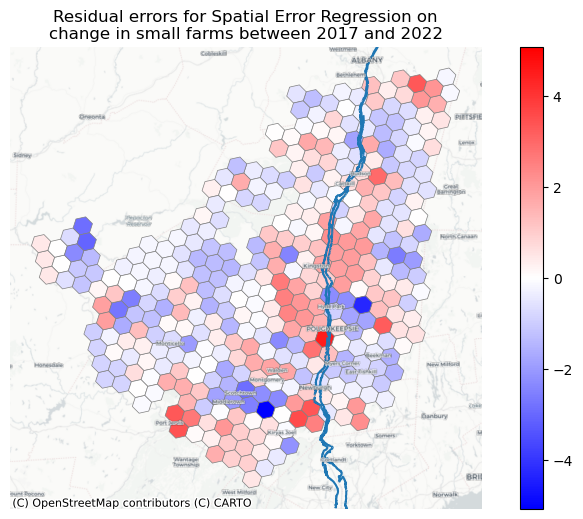

In [ ]:
hudson_diff_prep_errors = hudson_diff_prep.copy()
hudson_diff_prep_errors['GMerror_residuals'] = GMerror_diff_small_farms.predy[:,0] - hudson_diff_prep_errors['small_farms_per_hex']
hudson_diff_prep_errors['GMerror_residuals_u'] = GMerror_diff_small_farms.u

div_plot(hudson_diff_prep_errors, 'GMerror_residuals_u', proj_hudson, "Residual errors for Spatial Error Regression on\nchange in small farms between 2017 and 2022",labels=True,river=True)


In [ ]:
moran = esda.moran.Moran(hudson_diff_prep_errors['GMerror_residuals_u'], w_diff, permutations=9999)
print(moran.I)
print(moran.p_sim)

0.3965576063161177
0.0001


In [ ]:
indep_vars_full = [
                #    'full_owner_operators_pct_per_hex',    # removed for infinite multicollinearity
                  #  'part_owner_operators_pct_per_hex',
                    # 'tenant_operators_pct_per_hex',
                    # 'moveinyear_owner_trimean',
                    'moveinyear_renter_trimean',
                    # 'seasonal_vacancy_per_hex',
                    ##
                    'income_median',
                    # 'farm_to_dwelling_ratio',
                    ##
                    # 'distance_to_nearest_city',
                    # 'distance_to_nearest_village',
                    # 'distance_to_hudson',
                    # 'agdistrict_area',
                  #   'peja_area',
                    ##
                    # 'low_sales_farms_pct_per_hex',    # removed for infinite multicollinearity
                  #   'medium_sales_farms_pct_per_hex',
                    # 'high_sales_farms_pct_per_hex',
                    'farms_selling_per_hex',
                    ###
                    'large_farms_pct_per_hex',
                    'medium_farms_pct_per_hex',
                    ###
                    # 'pop_per_hex_2017',
                    # 'large_farms_per_hex_2017',
                    # 'medium_farms_per_hex_2017',
                    'small_farms_per_hex_2017',
                    'full_owner_operators_per_hex_2017',
                    'part_owner_operators_per_hex_2017',
                    'tenant_operators_per_hex_2017',
                    # 'income_median_2017',
                    # 'farm_to_dwelling_ratio_2017',
                    'moveinyear_owner_trimean_2017',
                    # 'moveinyear_renter_trimean_2017',
                    ###
                    'moveinyear_pct_new_all_2022',
                    # 'rentpctincome_median_2022',
                    # 'rent_lower_quartile_2022',
                    # 'rent_median_2022',
                    # 'rent_upper_quartile_2022',
                    ###
                    # 'rentpctincome_median',
                    'rent_lower_quartile',
                    # 'rent_median',
                    # 'rent_upper_quartile',  
                    ]

# 'medium_farms_pct_per_hex',
# 'small_farms_per_hex_2017',
# 'part_owner_operators_per_hex_2017',
# 'tenant_operators_per_hex_2017',


In [ ]:
hudson_diff_prep = hudson_diff_hex_r6_expanded.copy().dropna(subset=[dep_var]+indep_vars_full)

w_diff = libpysal.weights.Queen.from_dataframe(hudson_diff_prep, ids="hex_id")
w_diff.transform = 'R'

GMerror_diff_small_farms = spreg.GM_Error_Het(
    y = hudson_diff_prep[[dep_var]].values,
    x = hudson_diff_prep[indep_vars_full].values,
    w = w_diff,
    # spat_diag = True,
    # moran=True,
    name_y = dep_var,
    name_x = indep_vars_full,
    name_w = "Queen contiguity",
    name_ds = "Diff. btw. 2017 and 2022 (hex R6)"
)

print(GMerror_diff_small_farms.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: GM SPATIALLY WEIGHTED LEAST SQUARES (HET)
------------------------------------------------------------
Data set            :Diff. btw. 2017 and 2022 (hex R6)
Weights matrix      :Queen contiguity
Dependent Variable  :small_farms_per_hex                Number of Observations:         376
Mean dependent var  :      0.0791                Number of Variables   :          13
S.D. dependent var  :      1.9753                Degrees of Freedom    :         363
Pseudo R-squared    :      0.5999
N. of iterations    :           1                Step1c computed       :          No

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT        -9.10718         4.66477        -1.95233         0.05090
moveinyear_renter_trimea

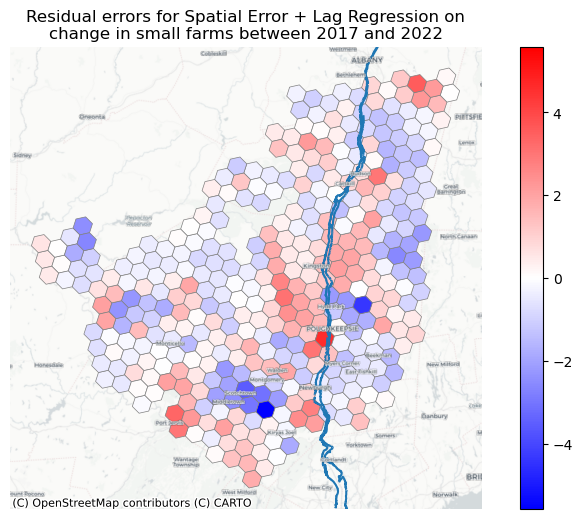

In [ ]:
hudson_diff_prep_errors = hudson_diff_prep.copy()
hudson_diff_prep_errors['GMerror_residuals'] = GMerror_diff_small_farms.predy[:,0] - hudson_diff_prep_errors['small_farms_per_hex']
hudson_diff_prep_errors['GMerror_residuals_u'] = GMerror_diff_small_farms.u

div_plot(hudson_diff_prep_errors, 'GMerror_residuals_u', proj_hudson, "Residual errors for Spatial Error + Lag Regression on\nchange in small farms between 2017 and 2022",labels=True,river=True)


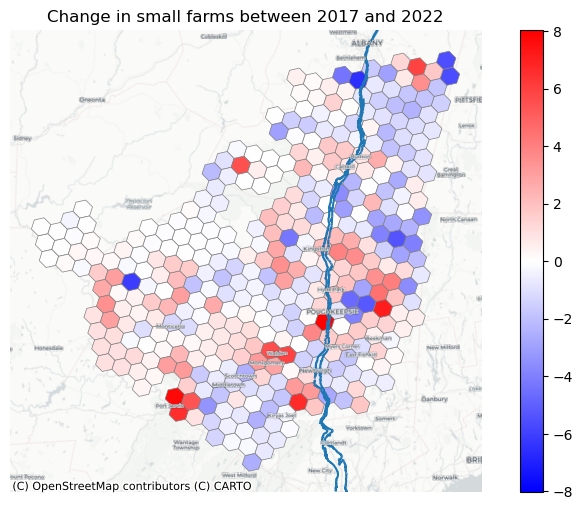

In [ ]:
div_plot(hudson_diff_prep_errors, 'small_farms_per_hex', proj_hudson, "Change in small farms between 2017 and 2022",labels=True,river=True)

In [ ]:
moran = esda.moran.Moran(hudson_diff_prep_errors['GMerror_residuals_u'], w_diff, permutations=9999)
print(moran.I)
print(moran.p_sim)

0.43578050645971994
0.0001


## GWR

### Small farms

In [ ]:
dep_var = 'small_farms_per_hex'

In [ ]:
indep_vars_full = [
                  #  'part_owner_operators_pct_per_hex',
                    # 'tenant_operators_pct_per_hex',
                    # 'moveinyear_owner_trimean',
                    'moveinyear_renter_trimean',
                    # 'seasonal_vacancy_per_hex',
                    ##
                    'income_median',
                    # 'farm_to_dwelling_ratio',
                    ##
                    # 'distance_to_nearest_city',
                    # 'distance_to_nearest_village',
                    # 'distance_to_hudson',
                    # 'agdistrict_area',
                    # 'peja_area',
                    ##
                  #   'medium_sales_farms_pct_per_hex',
                    # 'high_sales_farms_pct_per_hex',
                    'farms_selling_per_hex',
                    ###
                    'large_farms_pct_per_hex',
                    'medium_farms_pct_per_hex',
                    ###
                    # 'pop_per_hex_2017',
                    # 'large_farms_per_hex_2017',
                    # 'medium_farms_per_hex_2017',
                    'small_farms_per_hex_2017',
                    'full_owner_operators_per_hex_2017',
                    'part_owner_operators_per_hex_2017',
                    'tenant_operators_per_hex_2017',
                    # 'income_median_2017',
                    # 'farm_to_dwelling_ratio_2017',
                    'moveinyear_owner_trimean_2017',
                    # 'moveinyear_renter_trimean_2017',
                    ###
                    'moveinyear_pct_new_all_2022',
                    # 'rentpctincome_median_2022',
                    # 'rent_lower_quartile_2022',
                    # 'rent_median_2022',
                    # 'rent_upper_quartile_2022',
                    ###
                    # 'rentpctincome_median',
                    'rent_lower_quartile',
                    # 'rent_median',
                    # 'rent_upper_quartile',  
                    ]



In [ ]:
hudson_diff_prep = hudson_diff_hex_r6_expanded.dropna(subset=[dep_var]+indep_vars_full).copy()

hudson_diff_prep['X'] = hudson_diff_prep['geometry'].centroid.x
hudson_diff_prep['Y'] = hudson_diff_prep['geometry'].centroid.y

In [ ]:
target_variable = [dep_var]
feature_variables = indep_vars_full

y = hudson_diff_prep[target_variable[0]].values.reshape((-1,1))
X = hudson_diff_prep[feature_variables].values

u = hudson_diff_prep['X']
v = hudson_diff_prep['Y']
coords = list(zip(u,v))

In [ ]:
gwr_selector = Sel_BW(coords, y, X)
gwr_bw = gwr_selector.search(bw_min=5)
print(gwr_bw)

113.0


In [ ]:
gwr_results = GWR(coords, y, X, gwr_bw).fit()

In [ ]:
gwr_results.localR2[0:5]

array([[0.81763927],
       [0.75126783],
       [0.81094626],
       [0.72305938],
       [0.75441092]])

In [ ]:
gwr_results.summary()

Model type                                                         Gaussian
Number of observations:                                                 376
Number of covariates:                                                    13

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                            550.169
Log-likelihood:                                                    -605.081
AIC:                                                               1236.161
AICc:                                                              1239.324
BIC:                                                              -1602.272
R2:                                                                   0.624
Adj. R2:                                                              0.612

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

In [ ]:
for i, var in enumerate(['intercept'] + indep_vars_full):
    hudson_diff_prep[f'gwr_params_{var}'] = gwr_results.params[:,i]
hudson_diff_prep['gwr_local_rsquared'] = gwr_results.localR2

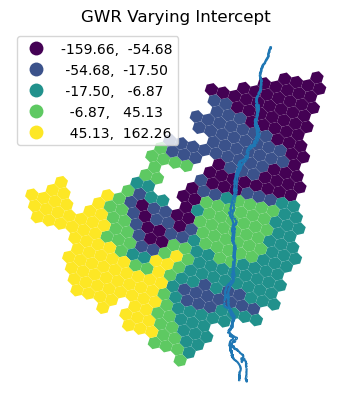

In [ ]:
ax = hudson_diff_prep.plot(column='gwr_params_intercept', scheme='quantiles', cmap='viridis', 
                                             legend=True, legend_kwds={'loc': 'upper left'})
hudson_river.plot(ax=ax)
#hudson_diff_prep.plot(ax=ax, column="agdistrict_area", cmap='Greys', legend=True, alpha=0.5)
plt.title('GWR Varying Intercept')
ax.axis('off');

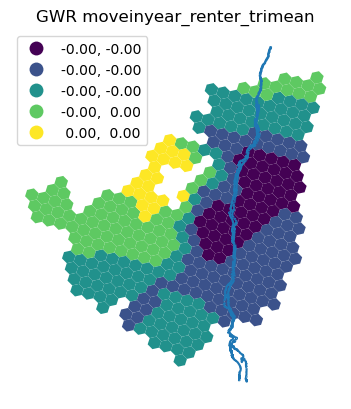

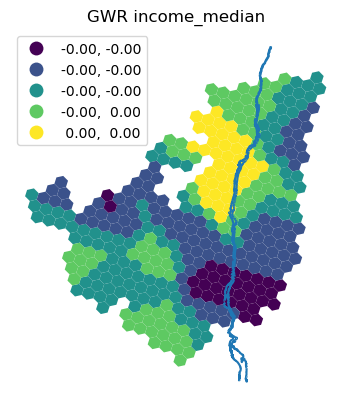

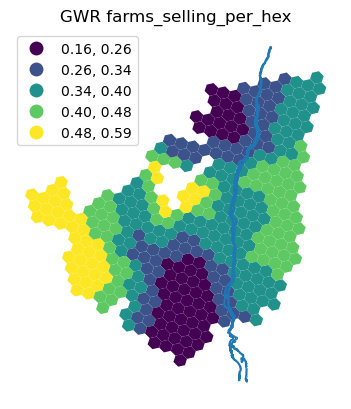

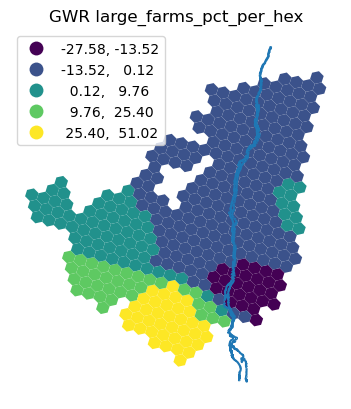

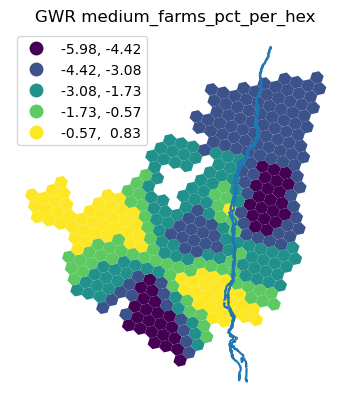

...

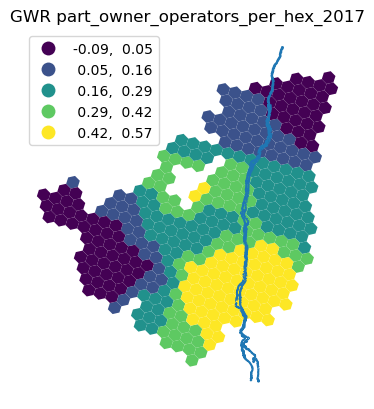

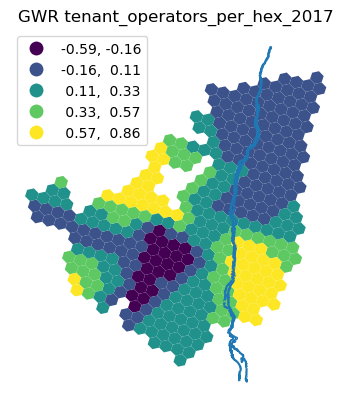

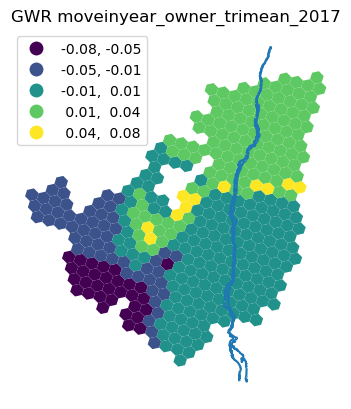

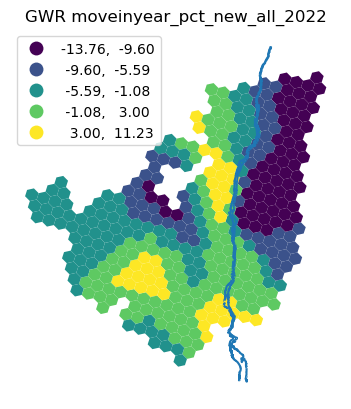

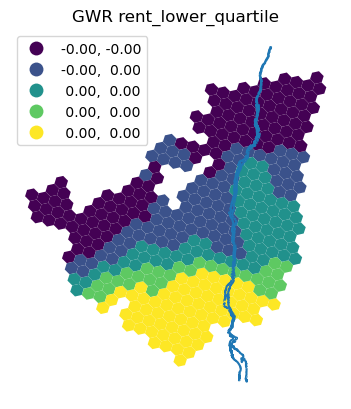

In [ ]:
for var in indep_vars_full:
    col = f'gwr_params_{var}'
    ax = hudson_diff_prep.plot(column=col, scheme='fisher_jenks', cmap='viridis', 
                                             legend=True, legend_kwds={'loc': 'upper left'})
    hudson_river.plot(ax=ax)
    plt.title(f'GWR {var}')
    ax.axis('off');

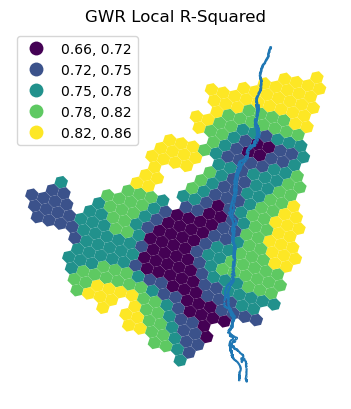

In [ ]:
ax = hudson_diff_prep.plot(column='gwr_local_rsquared', scheme='fisher_jenks', cmap='viridis', 
                                             legend=True, legend_kwds={'loc': 'upper left'})
hudson_river.plot(ax=ax)
plt.title('GWR Local R-Squared')
ax.axis('off');

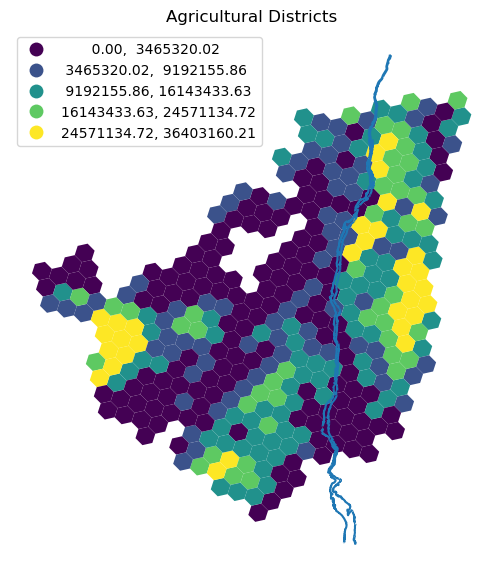

In [ ]:
ax = hudson_diff_prep.plot(column='agdistrict_area', scheme='fisher_jenks', cmap='viridis', 
                                             legend=True, legend_kwds={'loc': 'upper left'}, figsize=(7,7))
hudson_river.plot(ax=ax)
plt.title('Agricultural Districts')
ax.axis('off');

In [ ]:
for i, var in enumerate(['intercept'] + indep_vars_full):
    hudson_diff_prep[f'gwr_t_{var}'] = gwr_results.tvalues[:,i]
    hudson_diff_prep[f'gwr_sig_{var}'] = hudson_diff_prep[f'gwr_t_{var}'].abs() > 2

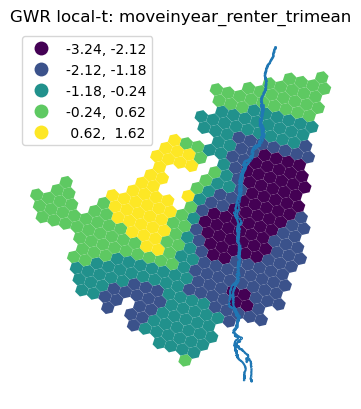

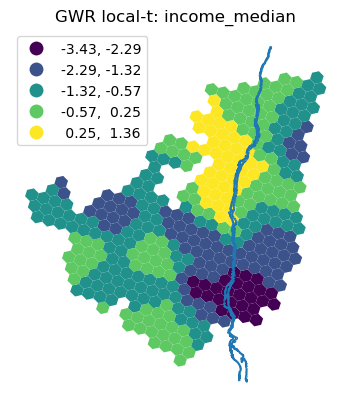

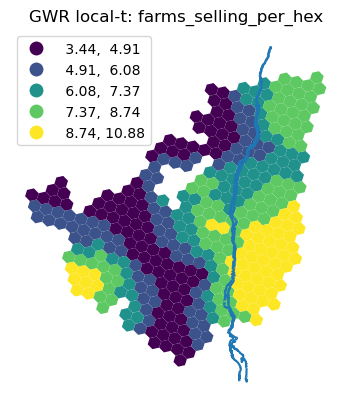

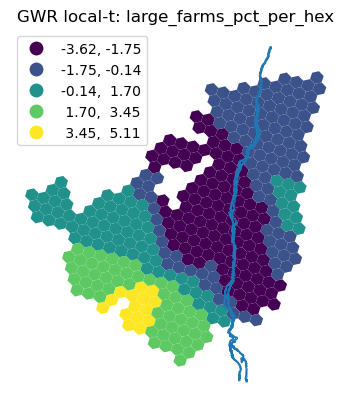

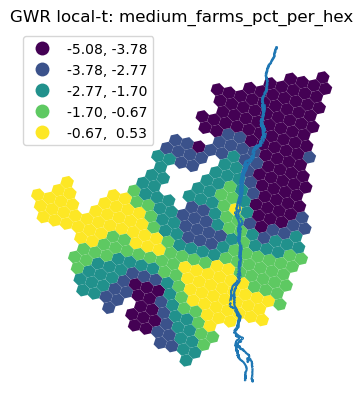

...

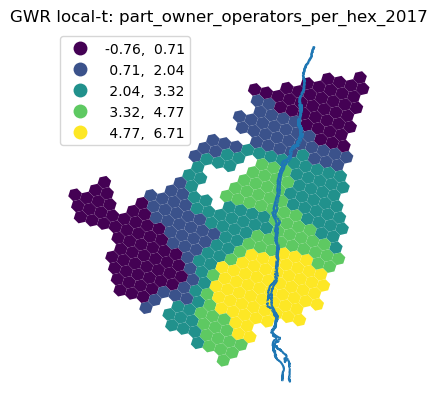

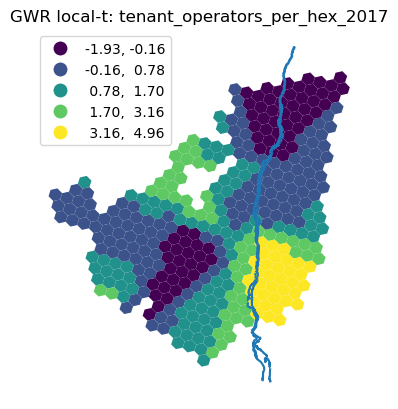

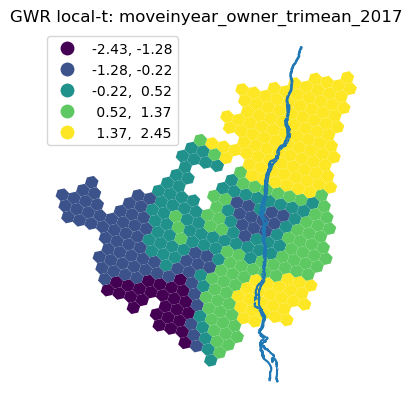

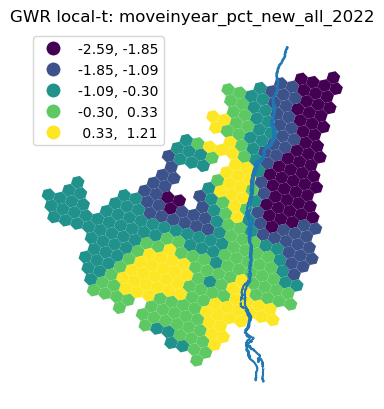

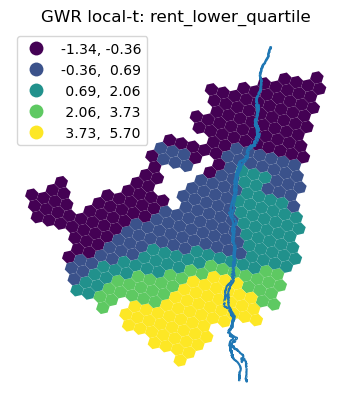

In [ ]:
for var in indep_vars_full:
    col = f'gwr_t_{var}'
    ax = hudson_diff_prep.plot(column=col, scheme='fisher_jenks', cmap='viridis', 
                                             legend=True, legend_kwds={'loc': 'upper left'})
    hudson_river.plot(ax=ax)
    plt.title(f'GWR local-t: {var}')
    ax.axis('off');

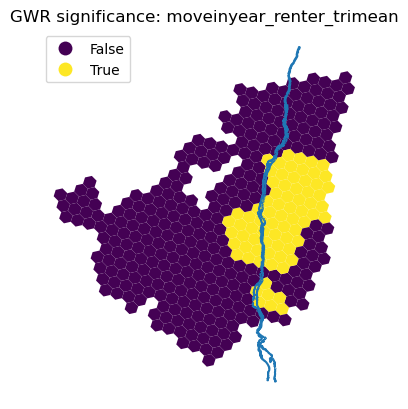

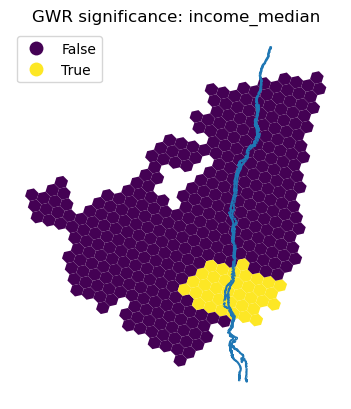

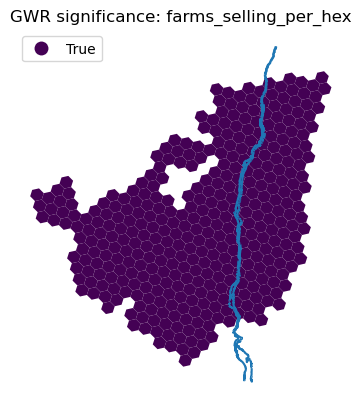

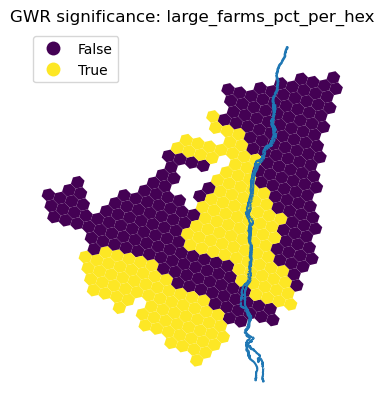

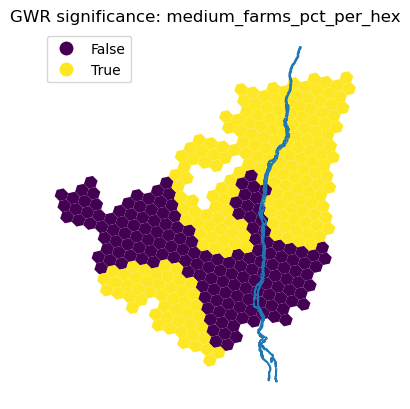

...

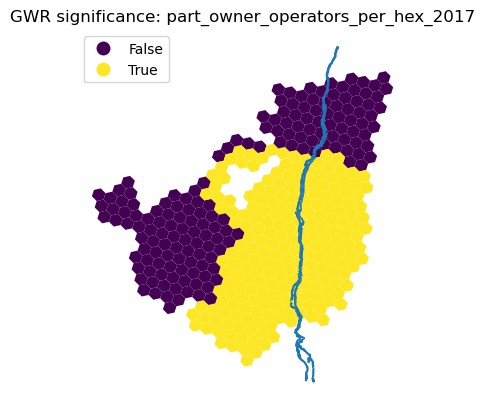

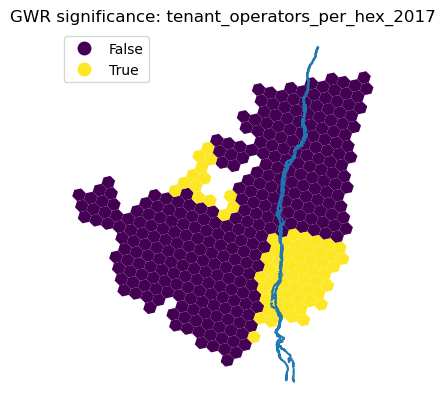

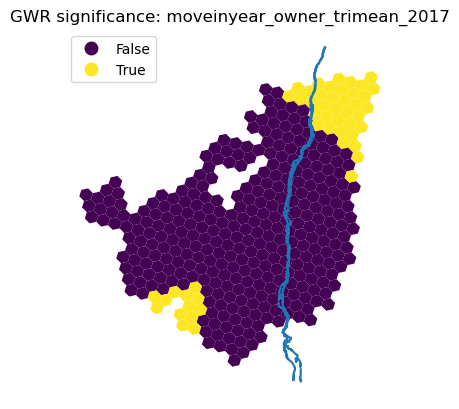

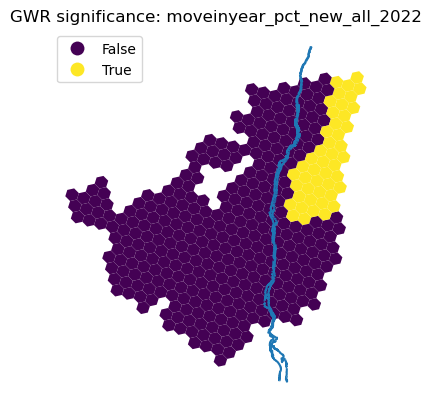

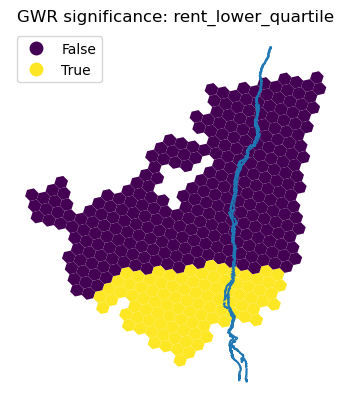

In [ ]:
for var in indep_vars_full:
    col = f'gwr_sig_{var}'
    ax = hudson_diff_prep.plot(column=col, cmap='viridis', 
                                             legend=True, legend_kwds={'loc': 'upper left'})
    hudson_river.plot(ax=ax)
    plt.title(f'GWR significance: {var}')
    ax.axis('off');

In [ ]:
for var in indep_vars_full:
    hudson_diff_prep[f'gwr_params_{var}_masked'] = hudson_diff_prep[f'gwr_params_{var}']
    hudson_diff_prep[f'gwr_params_{var}_masked'] = np.where(hudson_diff_prep[f'gwr_sig_{var}'] == False, np.nan, hudson_diff_prep[f'gwr_params_{var}_masked'])

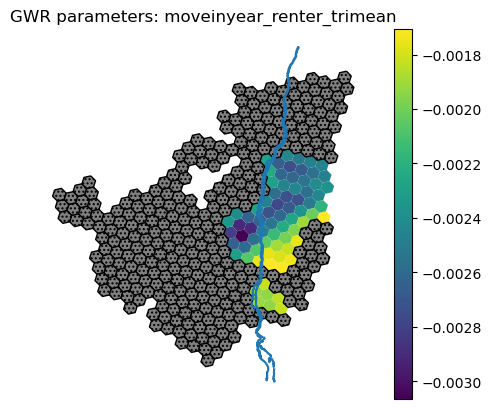

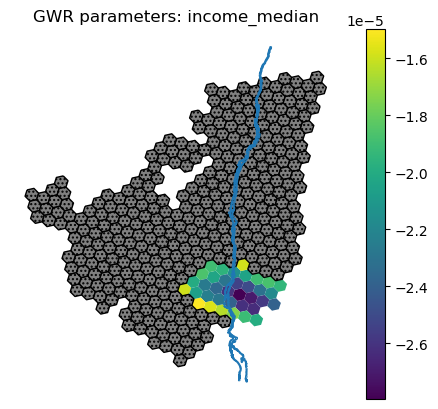

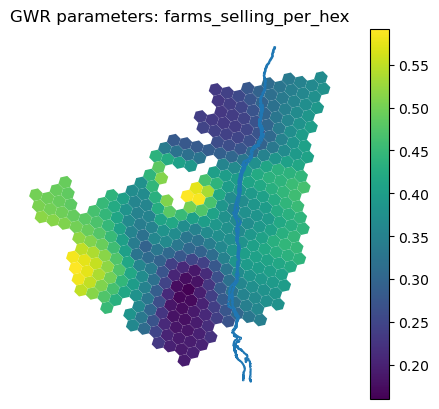

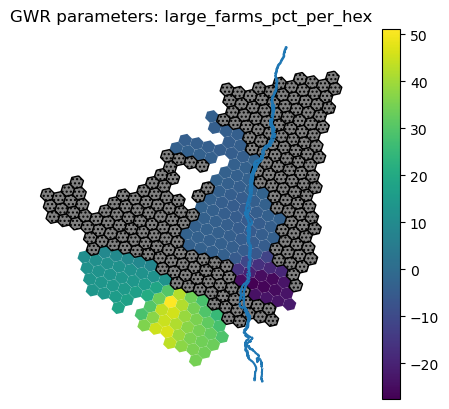

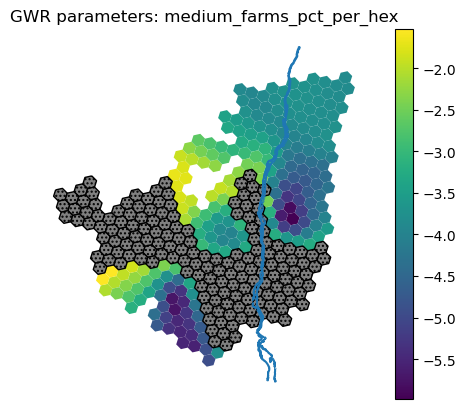

...

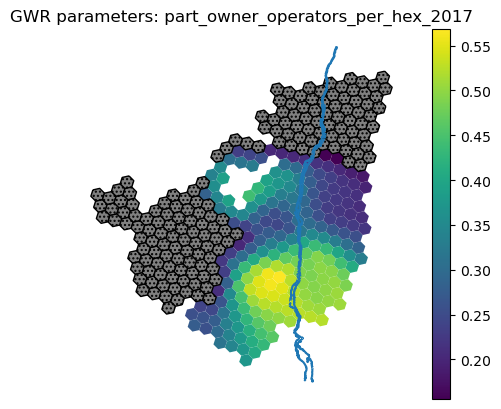

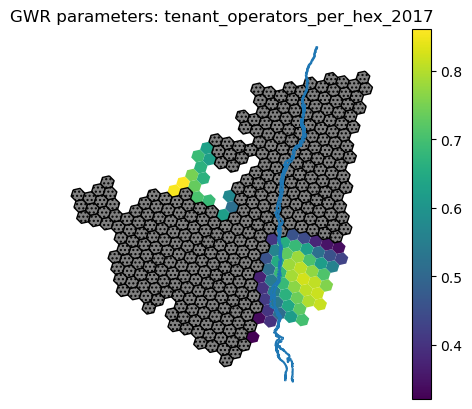

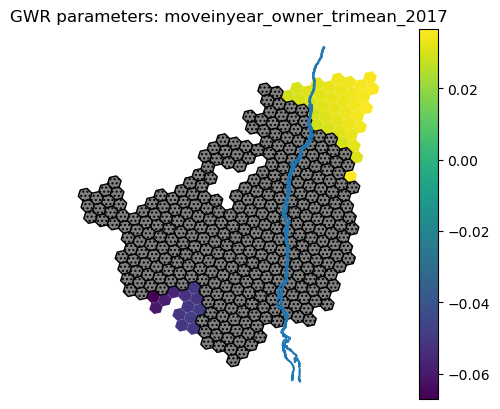

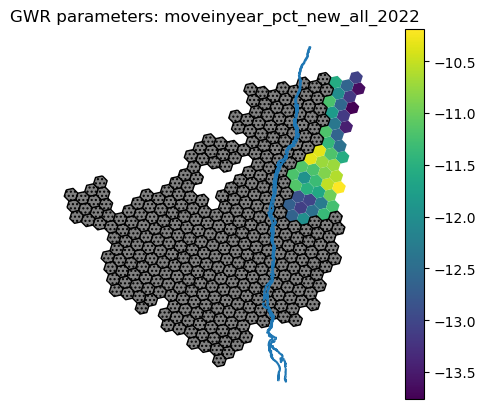

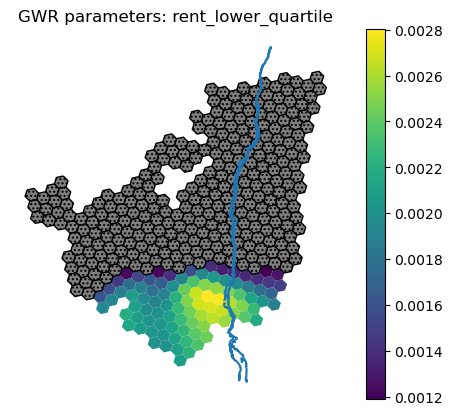

In [ ]:
for var in indep_vars_full:
    col = f'gwr_params_{var}_masked'
    ax = hudson_diff_prep.plot(column=col, 
                               #scheme='fisherjenks', 
                               cmap='viridis', 
                                             legend=True, 
                                             #legend_kwds={'loc': 'upper left'}, 
                                             missing_kwds={'hatch': '....', 'facecolor': 'grey', 'edgecolor': 'black'})
    hudson_river.plot(ax=ax)
    plt.title(f'GWR parameters: {var}')
    ax.axis('off');

### Tenant operators

In [ ]:
[col for col in hudson_diff_hex_r6_expanded.columns if 'tenant' in col]

['tenant_operators_per_sqmi',
 'tenant_operator_index',
 'tenant_operators_per_pop',
 'tenant_operators_per_hex',
 'tenant_operators_pct_per_hex',
 'tenant_operators_per_sqmi_2017',
 'tenant_operator_index_2017',
 'tenant_operators_per_pop_2017',
 'tenant_operators_per_hex_2017',
 'tenant_operators_pct_per_hex_2017',
 'tenant_operators_per_sqmi_2022',
 'tenant_operator_index_2022',
 'tenant_operators_per_pop_2022',
 'tenant_operators_per_hex_2022',
 'tenant_operators_pct_per_hex_2022']

In [ ]:
[col for col in hudson_diff_hex_r6_expanded.columns if 'renter' in col]

['moveinyear_renter_trimean',
 'moveinyear_pct_new_renter',
 'moveinyear_pct_new_total_renter',
 'renter_hh_per_sqmi',
 'renter_hh_per_hex',
 'renter_pct_per_hex',
 'moveinyear_renter_trimean_2017',
 'moveinyear_pct_new_renter_2017',
 'moveinyear_pct_new_total_renter_2017',
 'renter_hh_per_sqmi_2017',
 'renter_hh_per_hex_2017',
 'renter_pct_per_hex_2017',
 'moveinyear_renter_trimean_2022',
 'moveinyear_pct_new_renter_2022',
 'moveinyear_pct_new_total_renter_2022',
 'renter_hh_per_sqmi_2022',
 'renter_hh_per_hex_2022',
 'renter_pct_per_hex_2022']

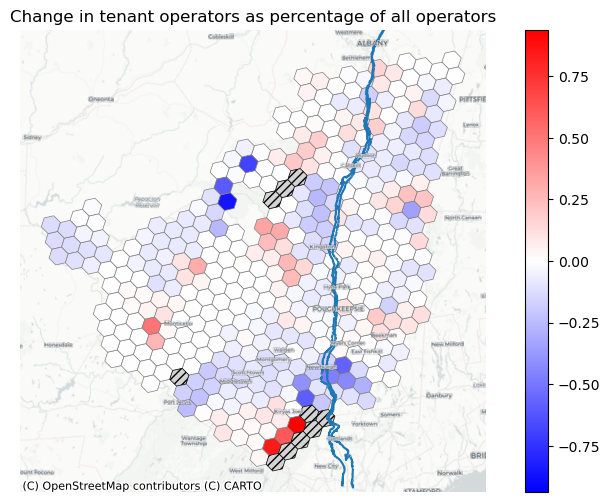

In [ ]:
div_plot(hudson_diff_hex_r6, 'tenant_operators_pct_per_hex', proj_hudson, "Change in tenant operators as percentage of all operators", labels=True, river=True)

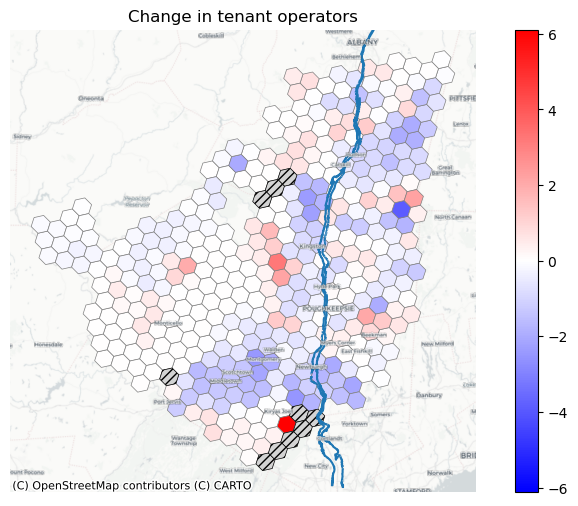

In [ ]:
div_plot(hudson_diff_hex_r6, 'tenant_operators_per_hex', proj_hudson, "Change in tenant operators", labels=True, river=True)

In [ ]:
dep_var = 'tenant_operators_per_hex'

In [ ]:
indep_vars_full = [
                    # 'distance_to_nearest_city',
                    'distance_to_nearest_village',
                    'distance_to_hudson',
                    'agdistrict_area',
                    'peja_area',
                    ###
                    # 'full_owner_operators_pct_per_hex', #dropped for high VIF
                    'part_owner_operators_pct_per_hex',
                    ###
                    'moveinyear_owner_trimean',
                    'moveinyear_renter_trimean',
                    # 'renter_pct_per_hex', # dropped for high VIF
                    # 'owner_pct_per_hex', # dropped for high VIF
                    'seasonal_vacancy_per_hex',
                    ##
                    'income_median',
                    'farm_to_dwelling_ratio',
                    ###
                    # 'low_sales_farms_pct_per_hex', #dropped for high VIF
                    'medium_sales_farms_pct_per_hex',
                    'high_sales_farms_pct_per_hex',
                    # 'farms_selling_per_hex',
                    ###
                    'medium_farms_pct_per_hex',
                    'small_farms_pct_per_hex',
                    'large_farms_pct_per_hex',
                    ###
                    'pop_per_hex_2017',
                    'large_farms_per_hex_2017',
                    'full_owner_operators_per_hex_2017',
                    'part_owner_operators_per_hex_2017',
                    'tenant_operators_per_hex_2017',
                    'income_median_2017',
                    'farm_to_dwelling_ratio_2017',
                    'moveinyear_owner_trimean_2017',
                    'moveinyear_renter_trimean_2017',
                    # 'renter_pct_per_hex_2017',
                    'owner_pct_per_hex_2017',
                    ###
                    'moveinyear_pct_new_all_2022',
                    'rentpctincome_median_2022',
                    # 'rent_lower_quartile_2022',
                    'rent_median_2022',
                    # 'rent_upper_quartile_2022',
                    'renter_pct_per_hex_2022',
                    'owner_pct_per_hex_2022',
                    ###
                    'rentpctincome_median',
                    'rent_lower_quartile',
                    'rent_median',
                    'rent_upper_quartile',
                    ]

In [ ]:
hudson_diff_prep = hudson_diff_hex_r6_expanded.copy().dropna(subset=[dep_var]+indep_vars_full)

w_diff = libpysal.weights.Queen.from_dataframe(hudson_diff_prep, ids="hex_id")
w_diff.transform = 'R'

OLS_diff_tenant = spreg.OLS(
    y = hudson_diff_prep[[dep_var]].values,
    x = hudson_diff_prep[indep_vars_full].values,
    w = w_diff,
    spat_diag = True,
    moran=True,
    name_y = dep_var,
    name_x = indep_vars_full,
    name_w = "Queen contiguity",
    name_ds = "Diff. btw. 2017 and 2022 (hex R6)"
)

print(OLS_diff_tenant.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :Diff. btw. 2017 and 2022 (hex R6)
Weights matrix      :Queen contiguity
Dependent Variable  :tenant_operators_per_hex                Number of Observations:         376
Mean dependent var  :     -0.2145                Number of Variables   :          35
S.D. dependent var  :      0.8375                Degrees of Freedom    :         341
R-squared           :      0.4995
Adjusted R-squared  :      0.4496
Sum squared residual:     131.637                F-statistic           :     10.0089
Sigma-square        :       0.386                Prob(F-statistic)     :   4.914e-34
S.E. of regression  :       0.621                Log likelihood        :    -336.207
Sigma-square ML     :       0.350                Akaike info criterion :     742.414
S.E of regression ML:      0.5917                Schwarz criterion     :     879.949

-----------------------

holding off on continuing this one for now...

### GWR

In [ ]:
dep_var = 'tenant_operators_per_hex'

In [ ]:
indep_vars_full = [
                    # 'distance_to_nearest_city',
                    #'distance_to_nearest_village',
                    'distance_to_hudson',
                    # 'agdistrict_area',
                    # 'peja_area',
                    ###
                    # 'full_owner_operators_pct_per_hex', #dropped for high VIF
                    'part_owner_operators_pct_per_hex',
                    ###
                    # 'moveinyear_owner_trimean',
                    'moveinyear_renter_trimean',
                    # 'renter_pct_per_hex', # dropped for high VIF
                    # 'owner_pct_per_hex', # dropped for high VIF
                    'seasonal_vacancy_per_hex',
                    ##
                    'income_median',
                    'farm_to_dwelling_ratio',
                    ###
                    # 'low_sales_farms_pct_per_hex', #dropped for high VIF
                    'medium_sales_farms_pct_per_hex',
                    'high_sales_farms_pct_per_hex',
                    # 'farms_selling_per_hex',
                    ###
                    'medium_farms_pct_per_hex',
                    'small_farms_pct_per_hex',
                    'large_farms_pct_per_hex',
                    ###
                    # 'pop_per_hex_2017',
                    'large_farms_per_hex_2017',
                    'full_owner_operators_per_hex_2017',
                    'part_owner_operators_per_hex_2017',
                    'tenant_operators_per_hex_2017',
                    # 'income_median_2017',
                    # 'farm_to_dwelling_ratio_2017',
                    'moveinyear_owner_trimean_2017',
                    'moveinyear_renter_trimean_2017',
                    # 'renter_pct_per_hex_2017',
                    'owner_pct_per_hex_2017',
                    ###
                    # 'moveinyear_pct_new_all_2022',
                    'rentpctincome_median_2022',
                    # 'rent_lower_quartile_2022',
                    # 'rent_median_2022',
                    # 'rent_upper_quartile_2022',
                    'renter_pct_per_hex_2022',
                    'owner_pct_per_hex_2022',
                    'income_median_2022',
                    ###
                    'rentpctincome_median',
                    'rent_lower_quartile',
                    'rent_median',
#                    'rent_upper_quartile',
                    ]

In [ ]:
hudson_diff_prep = hudson_diff_hex_r6_expanded.copy().dropna(subset=[dep_var]+indep_vars_full)

hudson_diff_prep['X'] = hudson_diff_prep['geometry'].centroid.x
hudson_diff_prep['Y'] = hudson_diff_prep['geometry'].centroid.y

###

target_variable = [dep_var]
feature_variables = indep_vars_full

y = hudson_diff_prep[target_variable[0]].values.reshape((-1,1))
X = hudson_diff_prep[feature_variables].values

u = hudson_diff_prep['X']
v = hudson_diff_prep['Y']
coords = list(zip(u,v))

###

gwr_selector = Sel_BW(coords, y, X)
gwr_bw = gwr_selector.search(bw_min=5)
print('bandwidth:',gwr_bw)

###

gwr_results = GWR(coords, y, X, gwr_bw).fit()

gwr_results.summary()

bandwidth: 214.0
Model type                                                         Gaussian
Number of observations:                                                 376
Number of covariates:                                                    26

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                            134.377
Log-likelihood:                                                    -340.080
AIC:                                                                732.160
AICc:                                                               738.504
BIC:                                                              -1940.980
R2:                                                                   0.489
Adj. R2:                                                              0.453

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- 

In [ ]:
for i, var in enumerate(['intercept'] + indep_vars_full):
    hudson_diff_prep[f'gwr_params_{var}'] = gwr_results.params[:,i]
hudson_diff_prep['gwr_local_rsquared'] = gwr_results.localR2

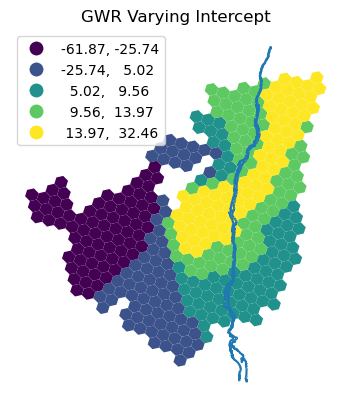

In [ ]:
ax = hudson_diff_prep.plot(column='gwr_params_intercept', scheme='quantiles', cmap='viridis', 
                                             legend=True, legend_kwds={'loc': 'upper left'})
hudson_river.plot(ax=ax)
#hudson_diff_prep.plot(ax=ax, column="agdistrict_area", cmap='Greys', legend=True, alpha=0.5)
plt.title('GWR Varying Intercept')
ax.axis('off');

c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\geopandas\plotting.py:658: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=figsize)


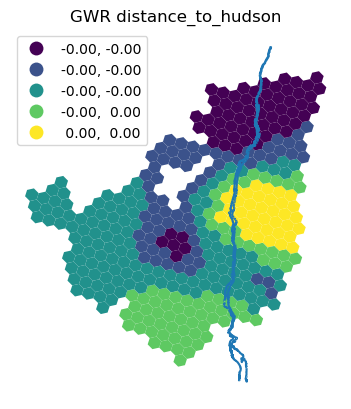

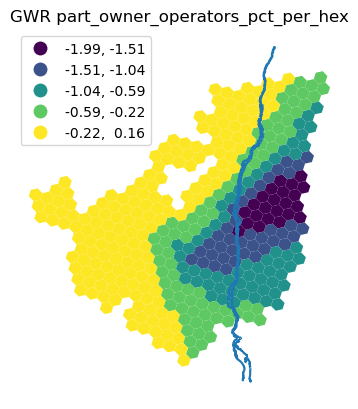

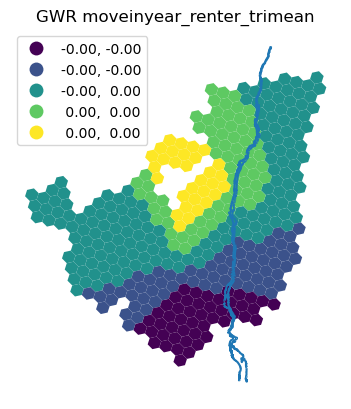

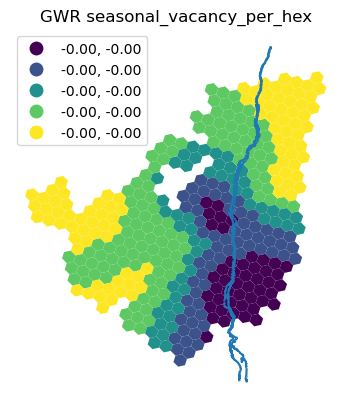

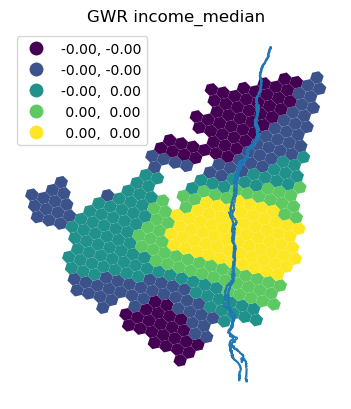

...

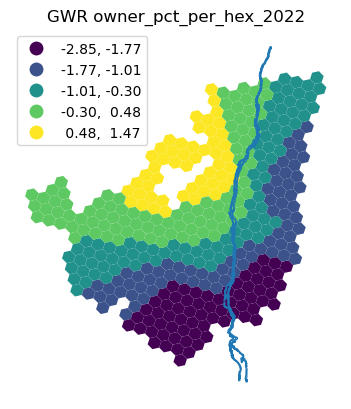

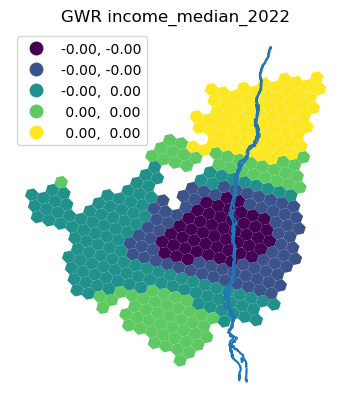

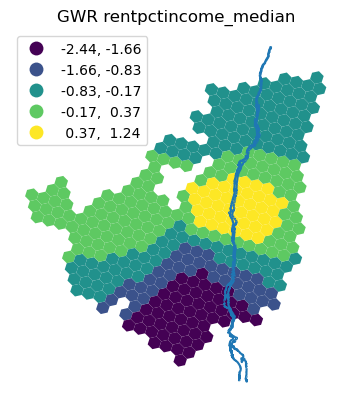

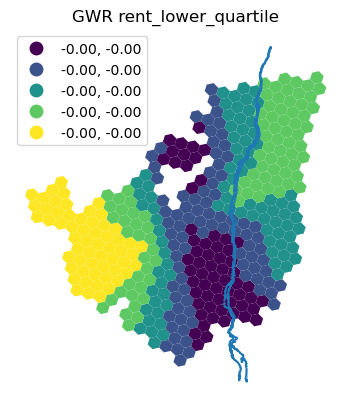

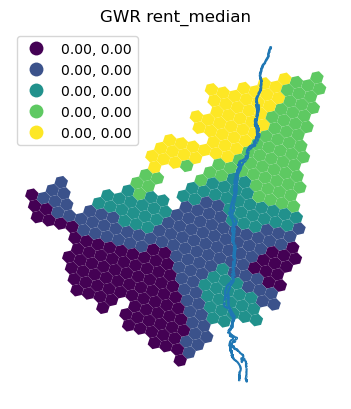

In [ ]:
for var in indep_vars_full:
    col = f'gwr_params_{var}'
    ax = hudson_diff_prep.plot(column=col, scheme='fisher_jenks', cmap='viridis', 
                                             legend=True, legend_kwds={'loc': 'upper left'})
    hudson_river.plot(ax=ax)
    plt.title(f'GWR {var}')
    ax.axis('off');

In [ ]:
plt.close("all")

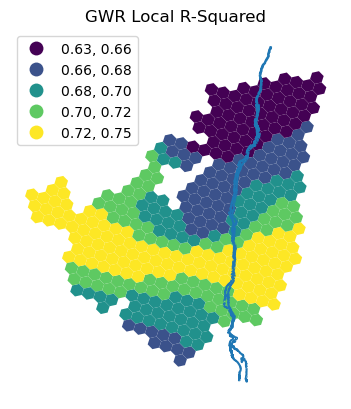

In [ ]:
ax = hudson_diff_prep.plot(column='gwr_local_rsquared', scheme='fisher_jenks', cmap='viridis', 
                                             legend=True, legend_kwds={'loc': 'upper left'})
hudson_river.plot(ax=ax)
plt.title('GWR Local R-Squared')
ax.axis('off');

In [ ]:
hudson_diff_prep = hudson_diff_prep.copy()

for i, var in enumerate(['intercept'] + indep_vars_full):
    hudson_diff_prep[f'gwr_t_{var}'] = gwr_results.tvalues[:,i]
    hudson_diff_prep[f'gwr_sig_{var}'] = hudson_diff_prep[f'gwr_t_{var}'].abs() > 2

hudson_diff_prep = hudson_diff_prep.copy()

for var in indep_vars_full:
    hudson_diff_prep[f'gwr_params_{var}_masked'] = hudson_diff_prep[f'gwr_params_{var}']
    hudson_diff_prep[f'gwr_params_{var}_masked'] = np.where(hudson_diff_prep[f'gwr_sig_{var}'] == False, np.nan, hudson_diff_prep[f'gwr_params_{var}_masked'])

c:\Users\Darcy Krasne\.conda\envs\info615\Lib\site-packages\geopandas\plotting.py:658: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=figsize)


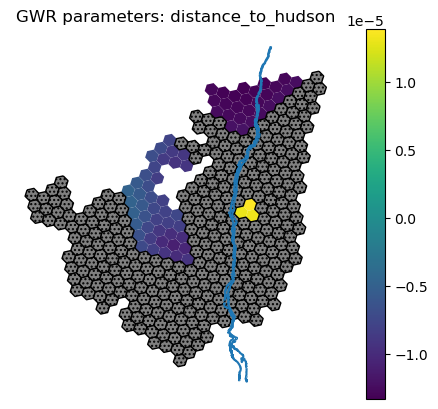

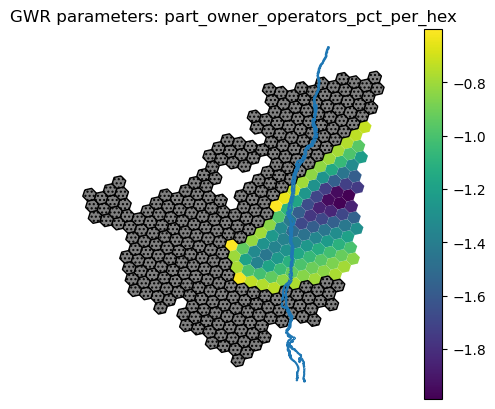

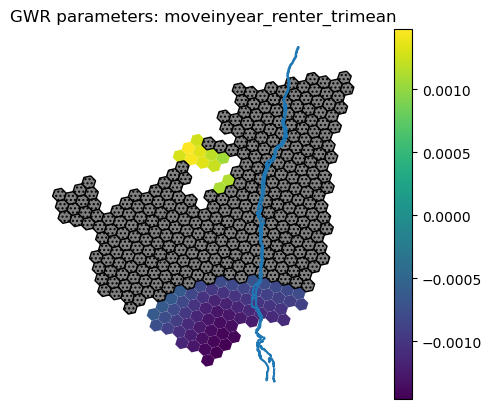

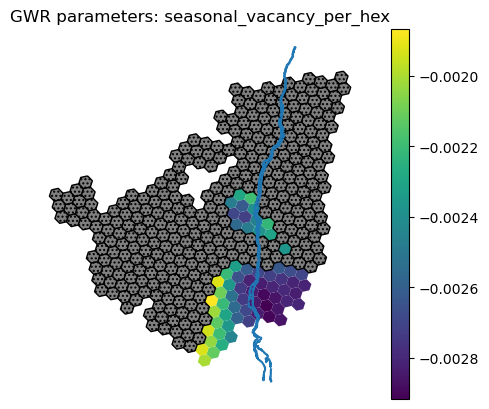

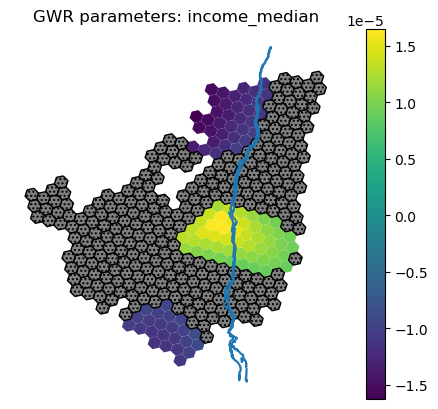

...

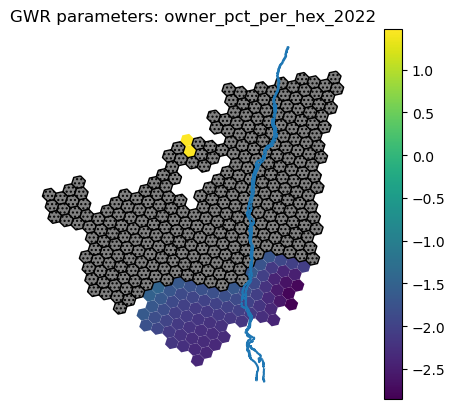

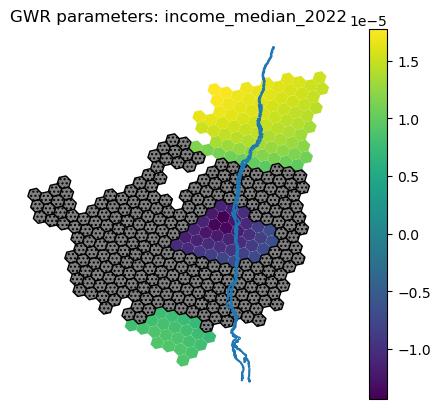

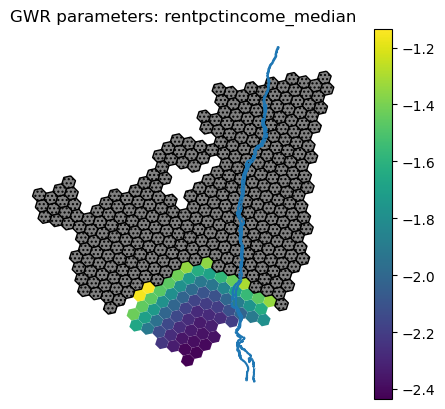

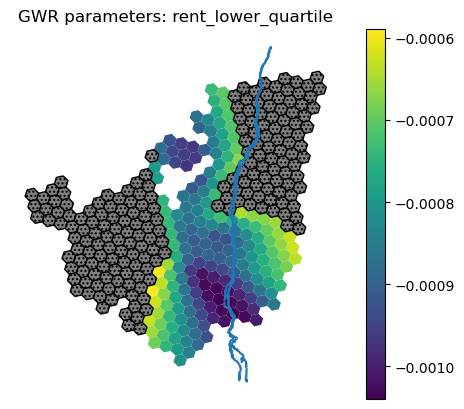

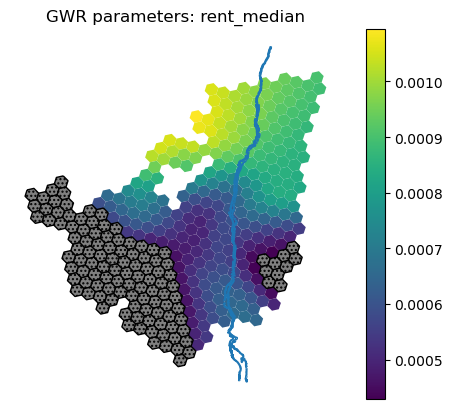

In [ ]:
for var in indep_vars_full:
    col = f'gwr_params_{var}_masked'
    ax = hudson_diff_prep.plot(column=col, 
                               #scheme='fisherjenks', 
                               cmap='viridis', 
                                             legend=True, 
                                             #legend_kwds={'loc': 'upper left'}, 
                                             missing_kwds={'hatch': '....', 'facecolor': 'grey', 'edgecolor': 'black'})
    hudson_river.plot(ax=ax)
    plt.title(f'GWR parameters: {var}')
    ax.axis('off');

In [ ]:
plt.close("all")